# **Breast Cancer Sınıflandırma Projesi**

## **Proje Genel Bakış**
Hedef: Breast Cancer Wisconsin (Diagnostic) veri seti kullanarak meme kanseri teşhisi için sınıflandırma modelleri geliştirmek ve Streamlit ile interaktif web uygulaması oluşturmak.

# 1.  Keşifsel Veri Analizi (Exploratory Data Analysis - EDA)

## 1.1 Veri Setinin İncelenmesi

In [1]:
# Kütühaneleri import et
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
# Veri setini içe aktar
data = pd.read_csv('../data/data.csv')

data.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [3]:
# Genel veri seti keşfi ve temel istatistikler
print("\nVeri seti boyutu:", data.shape)


Veri seti boyutu: (569, 33)


In [4]:
print("\nVeri seti bilgileri:")
data.info()


Veri seti bilgileri:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  peri

In [5]:
# Eksik değer kontrolü
print("\nEksik değerler:")
data.isnull().sum()


Eksik değerler:


id                           0
diagnosis                    0
radius_mean                  0
texture_mean                 0
perimeter_mean               0
area_mean                    0
smoothness_mean              0
compactness_mean             0
concavity_mean               0
concave points_mean          0
symmetry_mean                0
fractal_dimension_mean       0
radius_se                    0
texture_se                   0
perimeter_se                 0
area_se                      0
smoothness_se                0
compactness_se               0
concavity_se                 0
concave points_se            0
symmetry_se                  0
fractal_dimension_se         0
radius_worst                 0
texture_worst                0
perimeter_worst              0
area_worst                   0
smoothness_worst             0
compactness_worst            0
concavity_worst              0
concave points_worst         0
symmetry_worst               0
fractal_dimension_worst      0
Unnamed:

In [6]:
# İstatistiksel özet
print("\nİstatistiksel özet:")
data.describe().T


İstatistiksel özet:


,count,mean,std,min,25%,50%,75%,max
id,569.0,3.037183e+07,1.250206e+08,8670.000000,869218.000000,906024.000000,8.813129e+06,9.113205e+08
radius_mean,569.0,1.412729e+01,3.524049e+00,6.981000,11.700000,13.370000,1.578000e+01,2.811000e+01
texture_mean,569.0,1.928965e+01,4.301036e+00,9.710000,16.170000,18.840000,2.180000e+01,3.928000e+01
perimeter_mean,569.0,9.196903e+01,2.429898e+01,43.790000,75.170000,86.240000,1.041000e+02,1.885000e+02
area_mean,569.0,6.548891e+02,3.519141e+02,143.500000,420.300000,551.100000,7.827000e+02,2.501000e+03
smoothness_mean,569.0,9.636028e-02,1.406413e-02,0.052630,0.086370,0.095870,1.053000e-01,1.634000e-01
compactness_mean,569.0,1.043410e-01,5.281276e-02,0.019380,0.064920,0.092630,1.304000e-01,3.454000e-01
concavity_mean,569.0,8.879932e-02,7.971981e-02,0.000000,0.029560,0.061540,1.307000e-01,4.268000e-01
concave points_mean,569.0,4.891915e-02,3.880284e-02,0.000000,0.020310,0.033500,7.400000e-02,2.012000e-01
symmetry_mean,569.0,1.811619e-01,2.741428e-02,0.106000,0.161900,0.179200,1.957000e-01,3.040000e-01


## 1.2 Hedef Değişken Analizi

In [7]:
print("\nHedef değişken (diagnosis) dağılımı:")
diagnosis_counts = data['diagnosis'].value_counts()
print(diagnosis_counts)

print("\nYüzdelik dağılım:")
print(diagnosis_counts / len(data) * 100)


Hedef değişken (diagnosis) dağılımı:
diagnosis
B    357
M    212
Name: count, dtype: int64

Yüzdelik dağılım:
diagnosis
B    62.741652
M    37.258348
Name: count, dtype: float64


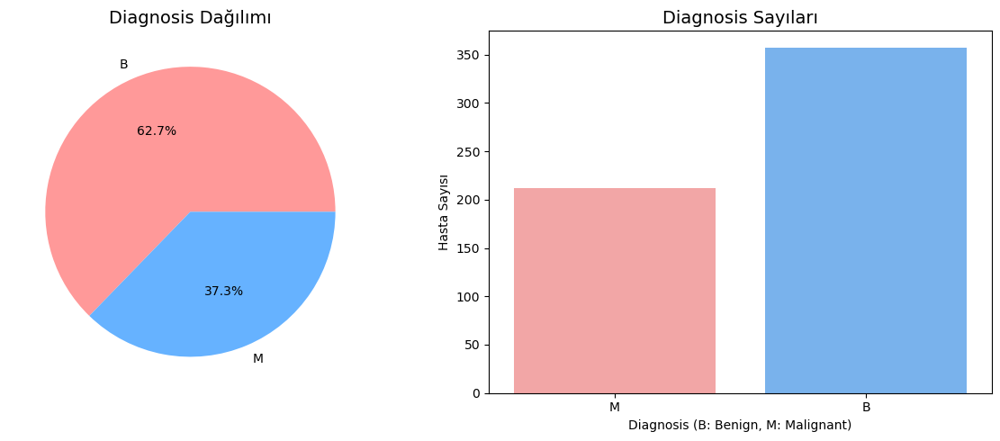

In [8]:
# Görselleştirmeler
plt.figure(figsize=(12, 5))

# 1. Solda: Diagnosis dağılımı - pie chart
plt.subplot(1, 2, 1)
colors = ['#FF9999', '#66B2FF']
diagnosis_counts.plot(kind='pie', autopct='%1.1f%%', colors=colors)
plt.title('Diagnosis Dağılımı', fontsize=14)
plt.ylabel('')

# 2. Sağda: Diagnosis dağılımı - count plot
plt.subplot(1, 2, 2)
sns.countplot(x='diagnosis', data=data, hue='diagnosis', palette=colors)
plt.title('Diagnosis Sayıları', fontsize=14)
plt.xlabel('Diagnosis (B: Benign, M: Malignant)')
plt.ylabel('Hasta Sayısı')

plt.tight_layout()
plt.show()


## 1.3 Özellik Analizi ve Görselleştirmeler

In [9]:
data.columns

Index(['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst', 'Unnamed: 32'],
      dtype='object')

In [10]:
# Özellik isimlerinden 'mean', 'se', 'worst' içerenleri ayrı listelere ayır
mean_features = [col for col in data.columns if '_mean' in col]
se_features = [col for col in data.columns if '_se' in col]
worst_features = [col for col in data.columns if '_worst' in col]

mean_features.append('diagnosis')
se_features.append('diagnosis')
worst_features.append('diagnosis')


print("Mean features:", mean_features)
print("SE features:", se_features)
print("Worst features:", worst_features)

Mean features: ['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean', 'diagnosis']
SE features: ['radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se', 'fractal_dimension_se', 'diagnosis']
Worst features: ['radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave points_worst', 'symmetry_worst', 'fractal_dimension_worst', 'diagnosis']


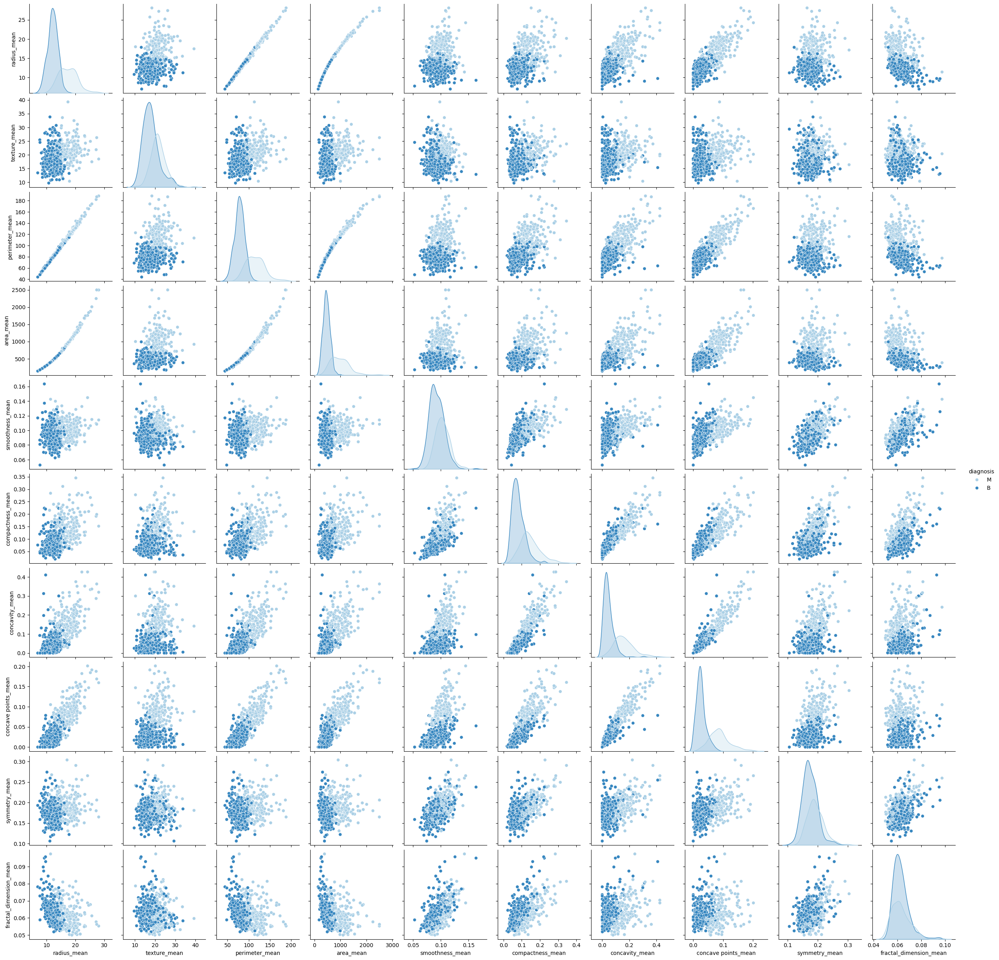

In [11]:
# pairplot for mean columns
sns.pairplot(data[mean_features],hue = 'diagnosis', palette='Blues')

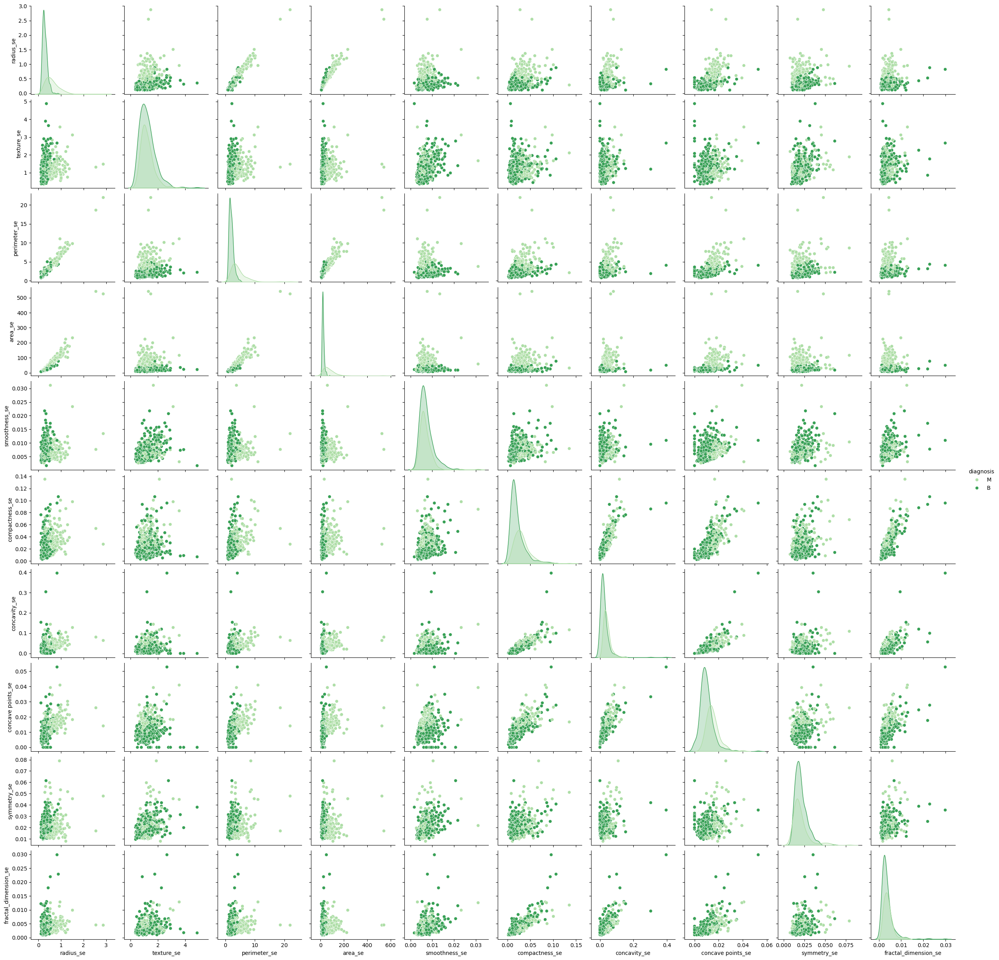

In [12]:
# pairplot for se columns
sns.pairplot(data[se_features],hue = 'diagnosis', palette='Greens')

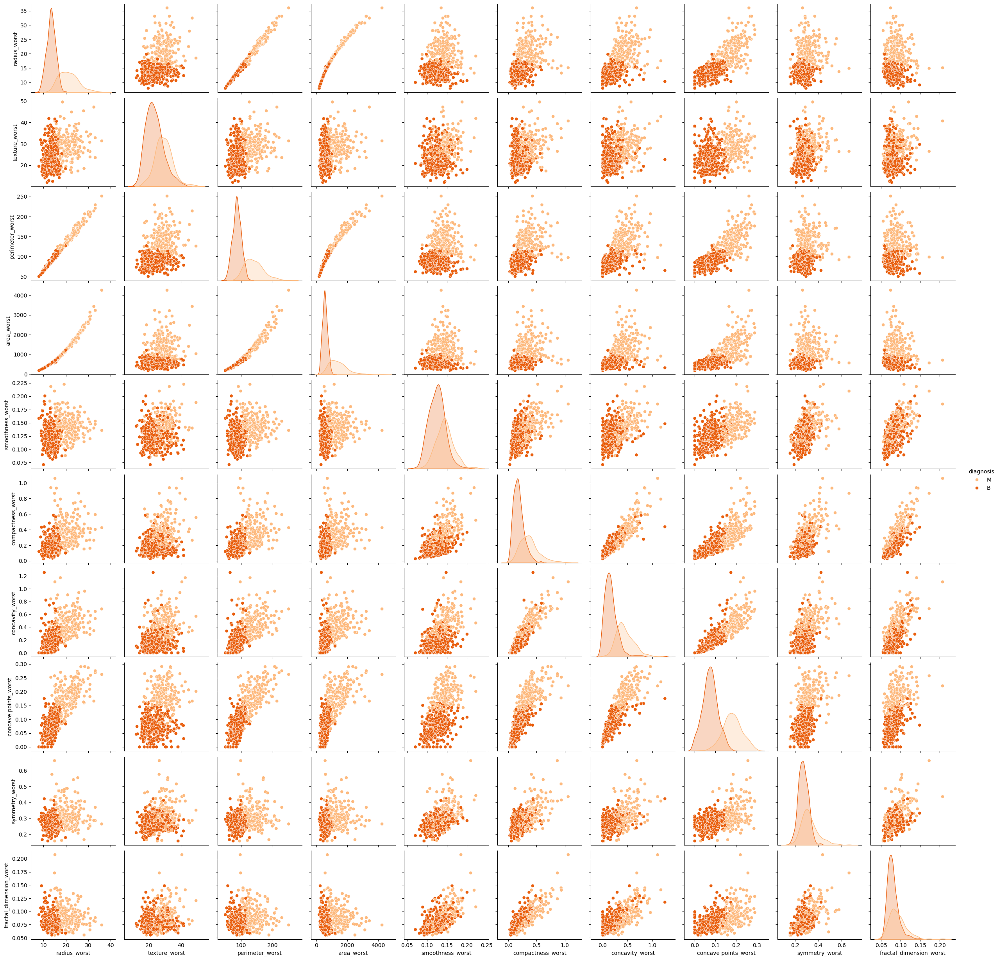

In [13]:
# pairplot for worst columns
sns.pairplot(data[worst_features],hue = 'diagnosis', palette='Oranges')

## 1.4 Korelasyon analizi: Özellikler arası ilişkiler

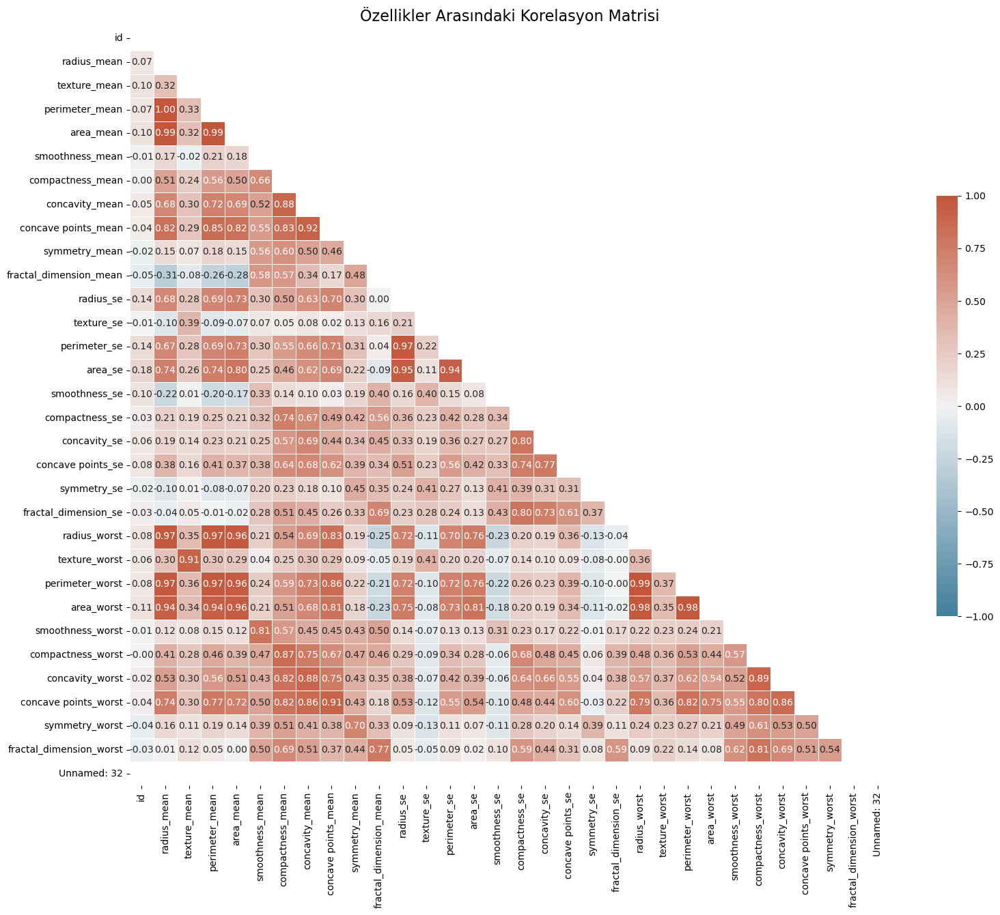

In [14]:
# Korelasyon matrisini hesapla
numeric_data = data.select_dtypes(include=['float64', 'int64'])
corr_matrix = numeric_data.corr()

# Korelasyon matrisini görselleştir
plt.figure(figsize=(16, 14))
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Isı haritası (heatmap) oluştur
sns.heatmap(corr_matrix, mask=mask, cmap=cmap, vmax=1, vmin=-1, center=0,
            square=True, linewidths=.5, annot=True, fmt='.2f', 
            cbar_kws={"shrink": .5})

plt.title('Özellikler Arasındaki Korelasyon Matrisi', fontsize=16)
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()



In [15]:
# Yüksek korelasyona sahip özellikleri görselleştir
high_corr_pairs = []
high_corr_threshold = 0.9

# Korelasyon matrisini tarayarak yüksek korelasyonlu çiftleri bul
for i in range(len(corr_matrix.columns)):
    for j in range(i+1, len(corr_matrix.columns)):
        if abs(corr_matrix.iloc[i, j]) > high_corr_threshold:
            high_corr_pairs.append((corr_matrix.columns[i], corr_matrix.columns[j], corr_matrix.iloc[i, j]))

# Yüksek korelasyona sahip çiftleri göster
print(f"\n{high_corr_threshold} değerinden yüksek korelasyona sahip özellik çiftleri:")
for pair in high_corr_pairs:
    print(f"{pair[0]} ve {pair[1]}: {pair[2]:.4f}")


0.9 değerinden yüksek korelasyona sahip özellik çiftleri:
radius_mean ve perimeter_mean: 0.9979
radius_mean ve area_mean: 0.9874
radius_mean ve radius_worst: 0.9695
radius_mean ve perimeter_worst: 0.9651
radius_mean ve area_worst: 0.9411
texture_mean ve texture_worst: 0.9120
perimeter_mean ve area_mean: 0.9865
perimeter_mean ve radius_worst: 0.9695
perimeter_mean ve perimeter_worst: 0.9704
perimeter_mean ve area_worst: 0.9415
area_mean ve radius_worst: 0.9627
area_mean ve perimeter_worst: 0.9591
area_mean ve area_worst: 0.9592
concavity_mean ve concave points_mean: 0.9214
concave points_mean ve concave points_worst: 0.9102
radius_se ve perimeter_se: 0.9728
radius_se ve area_se: 0.9518
perimeter_se ve area_se: 0.9377
radius_worst ve perimeter_worst: 0.9937
radius_worst ve area_worst: 0.9840
perimeter_worst ve area_worst: 0.9776


# 2. Veri Ön İşleme 

## 2.1 Eksik değer kontrolü ve işleme

In [16]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

In [17]:
# "Unnamed: 32" ve "id" sütununu kaldır
data = data.drop(columns=['id', 'Unnamed: 32'])
data.columns

Index(['diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')

## 2.2 Hedef değişkeni sayısal olarak temsil etme

In [18]:
data.diagnosis.unique()

array(['M', 'B'], dtype=object)

In [19]:
data['diagnosis'] = data['diagnosis'].apply(lambda val: 1 if val == 'M' else 0)

In [20]:
data.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [21]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   diagnosis                569 non-null    int64  
 1   radius_mean              569 non-null    float64
 2   texture_mean             569 non-null    float64
 3   perimeter_mean           569 non-null    float64
 4   area_mean                569 non-null    float64
 5   smoothness_mean          569 non-null    float64
 6   compactness_mean         569 non-null    float64
 7   concavity_mean           569 non-null    float64
 8   concave points_mean      569 non-null    float64
 9   symmetry_mean            569 non-null    float64
 10  fractal_dimension_mean   569 non-null    float64
 11  radius_se                569 non-null    float64
 12  texture_se               569 non-null    float64
 13  perimeter_se             569 non-null    float64
 14  area_se                  5

In [22]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
diagnosis,569.0,0.372583,0.483918,0.000000,0.000000,0.000000,1.000000,1.00000
radius_mean,569.0,14.127292,3.524049,6.981000,11.700000,13.370000,15.780000,28.11000
texture_mean,569.0,19.289649,4.301036,9.710000,16.170000,18.840000,21.800000,39.28000
perimeter_mean,569.0,91.969033,24.298981,43.790000,75.170000,86.240000,104.100000,188.50000
area_mean,569.0,654.889104,351.914129,143.500000,420.300000,551.100000,782.700000,2501.00000
smoothness_mean,569.0,0.096360,0.014064,0.052630,0.086370,0.095870,0.105300,0.16340
compactness_mean,569.0,0.104341,0.052813,0.019380,0.064920,0.092630,0.130400,0.34540
concavity_mean,569.0,0.088799,0.079720,0.000000,0.029560,0.061540,0.130700,0.42680
concave points_mean,569.0,0.048919,0.038803,0.000000,0.020310,0.033500,0.074000,0.20120
symmetry_mean,569.0,0.181162,0.027414,0.106000,0.161900,0.179200,0.195700,0.30400


## 2.3 Aykırı değer tespiti ve temizleme

In [23]:
import seaborn as sns
import matplotlib.pyplot as plt

# Aykırı değerleri tespit etmek için kutu grafikleri oluşturma fonksiyonu
def plot_boxplots(dataframe, features, n_rows, n_cols, figsize=(15, 15)):
    plt.figure(figsize=figsize)
    for i, feature in enumerate(features):
        if i < n_rows * n_cols:
            plt.subplot(n_rows, n_cols, i + 1)
            sns.boxplot(x='diagnosis', y=feature, data=dataframe, hue='diagnosis', palette=colors)
            plt.title(f'Box Plot of {feature} by Diagnosis')
            plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


# IQR yöntemini kullanarak aykırı değerleri tespiti için fonksiyon
def detect_outliers_iqr(df, features):
    outlier_indices = []
    for feature in features:
        # Q1 (25. yüzdelik) ve Q3 (75. yüzdelik) hesaplayın
        Q1 = df[feature].quantile(0.25)
        Q3 = df[feature].quantile(0.75)
        
        # IQR (Interquartile Range) hesaplayın
        IQR = Q3 - Q1
        
        # Aykırı değer adımını hesaplayın
        outlier_step = 1.5 * IQR
        
        # Aykırı değerleri tespit edin
        feature_outliers = df[(df[feature] < Q1 - outlier_step) | (df[feature] > Q3 + outlier_step)].index
        outlier_indices.extend  (feature_outliers)
    
    #  Aykırı değerlerin tekrar edenlerini sayın
    outlier_counts = pd.Series(outlier_indices).value_counts()
    
    # Birden fazla özellik için aykırı değerler olan veri noktalarının endekslerini döndürün
    return outlier_counts[outlier_counts > 2].index.tolist()

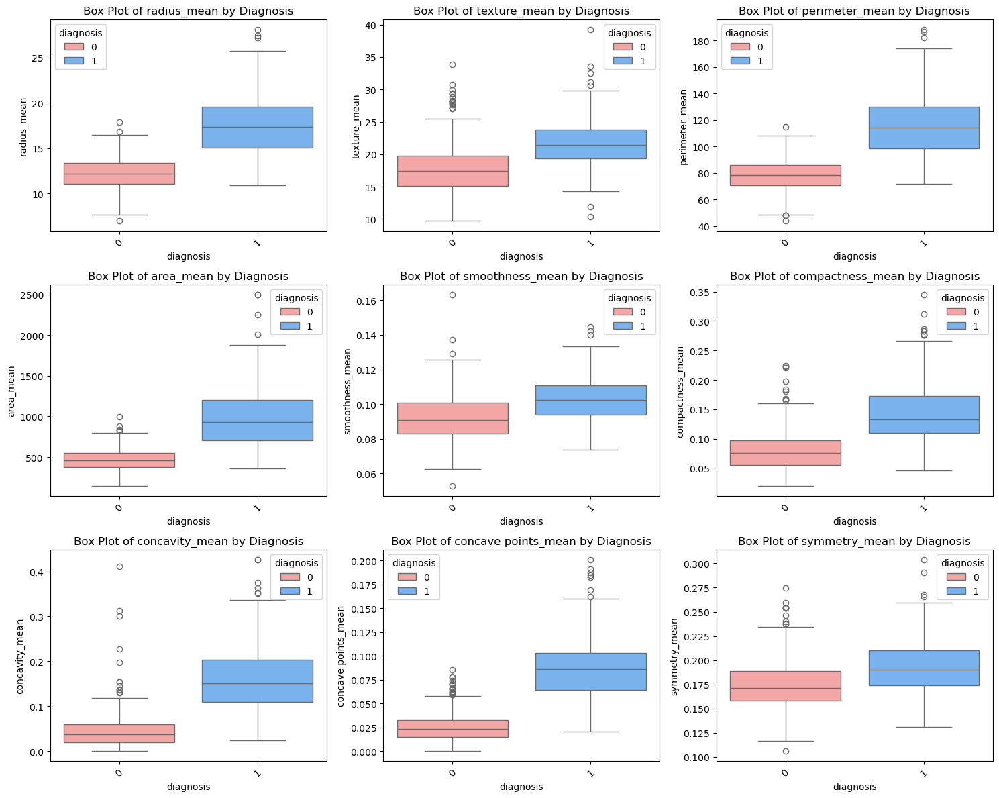

Number of outliers detected: 17
Outlier indices: [122, 108, 82, 352, 180, 212, 202, 461, 78, 258, 3, 521, 503, 236, 164, 339, 152]


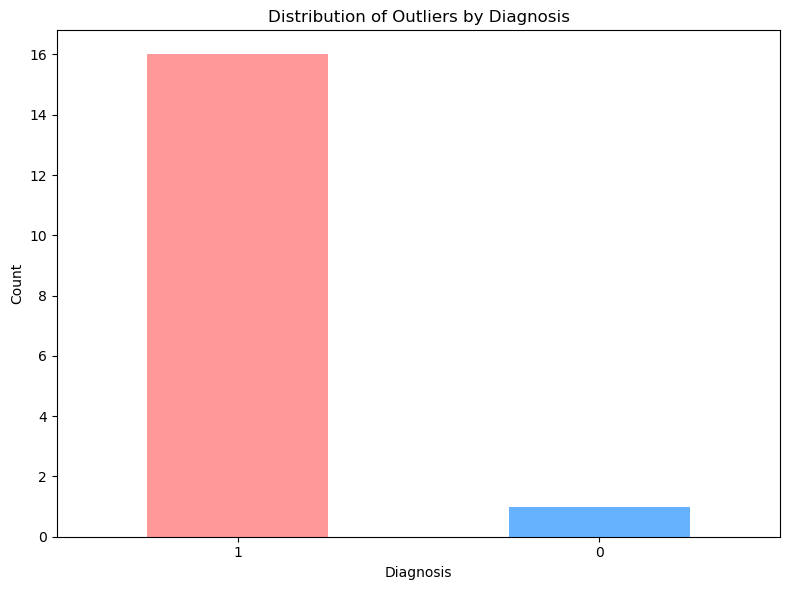

In [24]:
# Aykırı değerleri belirlemek için ortalama özellikler için kutu grafikleri çizelim
plot_boxplots(data, mean_features[:-1], 3, 3, figsize=(15, 12))

# Ortalama özellikler için uç değerleri alın
mean_outliers = detect_outliers_iqr(data, mean_features[:-1])

print(f"Number of outliers detected: {len(mean_outliers)}")
print("Outlier indices:", mean_outliers)

# diagnosis göre aykırı değerlerin dağılımını görselleştirin
if len(mean_outliers) > 0:
    outlier_diagnosis = data.loc[mean_outliers, 'diagnosis'].value_counts()
    plt.figure(figsize=(8, 6))
    outlier_diagnosis.plot(kind='bar', color=colors)
    plt.title('Distribution of Outliers by Diagnosis')
    plt.xlabel('Diagnosis')
    plt.ylabel('Count')
    plt.xticks(rotation=0)
    plt.tight_layout()
    plt.show()

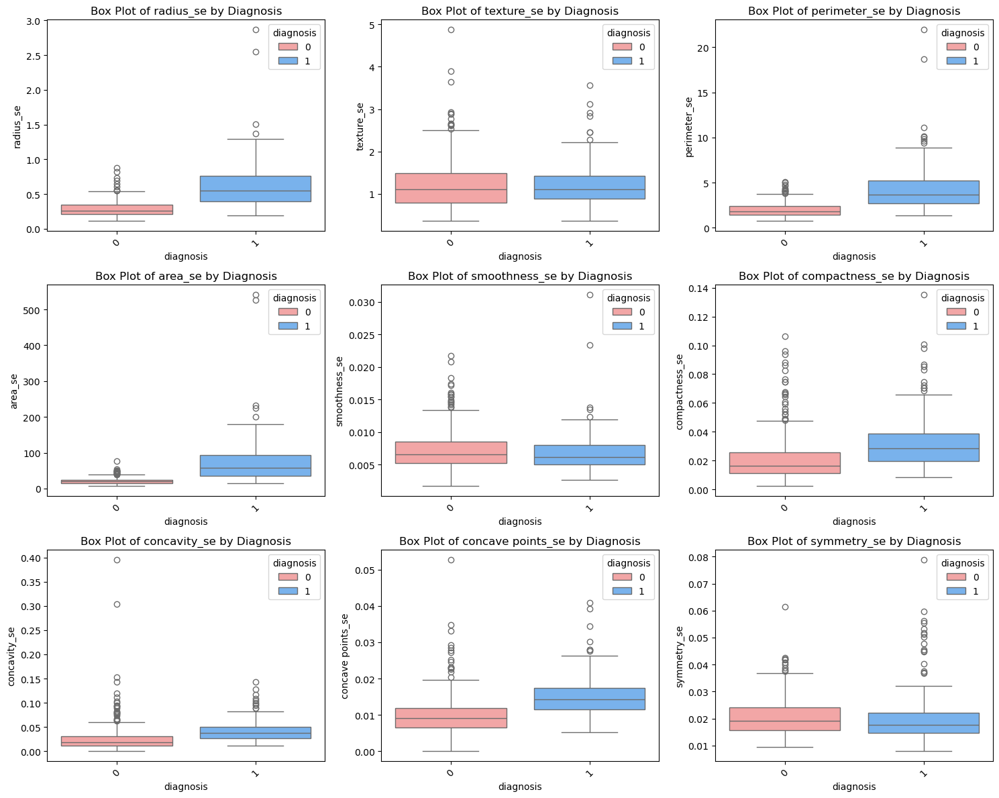

Number of outliers detected: 54
Outlier indices: [12, 122, 78, 42, 290, 108, 138, 212, 258, 213, 68, 176, 366, 152, 468, 461, 376, 190, 210, 485, 250, 161, 563, 25, 0, 71, 82, 38, 77, 302, 300, 352, 339, 460, 417, 272, 265, 236, 368, 218, 168, 521, 116, 539, 288, 351, 388, 3, 112, 314, 564, 369, 503, 345]


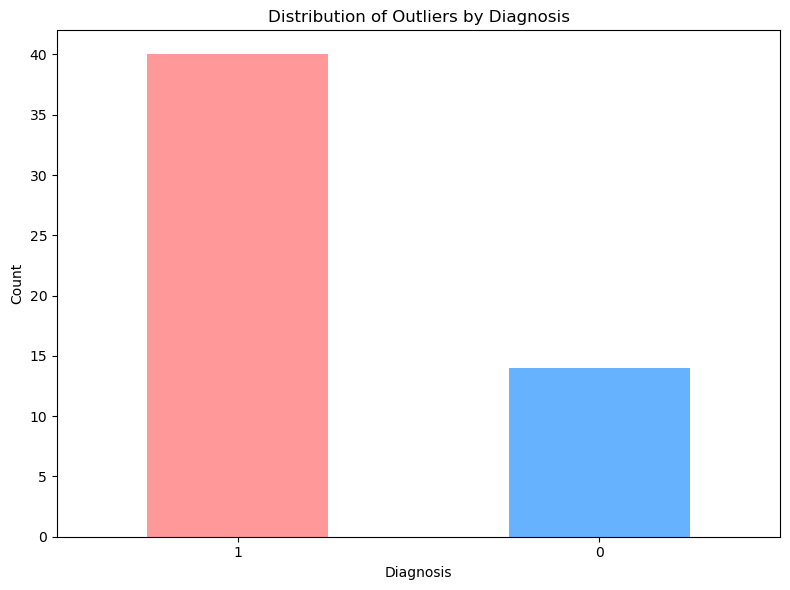

In [25]:
# Aykırı değerleri belirlemek için se özellikleri için kutu grafikleri çizelim
plot_boxplots(data, se_features[:-1], 3, 3, figsize=(15, 12))

# se özellikler için uç değerleri alın
se_outliers = detect_outliers_iqr(data, se_features[:-1])

print(f"Number of outliers detected: {len(se_outliers)}")
print("Outlier indices:", se_outliers)

# diagnosis göre aykırı değerlerin dağılımını görselleştirin
if len(se_outliers) > 0:
    outlier_diagnosis = data.loc[se_outliers, 'diagnosis'].value_counts()
    plt.figure(figsize=(8, 6))
    outlier_diagnosis.plot(kind='bar', color=colors)
    plt.title('Distribution of Outliers by Diagnosis')
    plt.xlabel('Diagnosis')
    plt.ylabel('Count')
    plt.xticks(rotation=0)
    plt.tight_layout()
    plt.show()

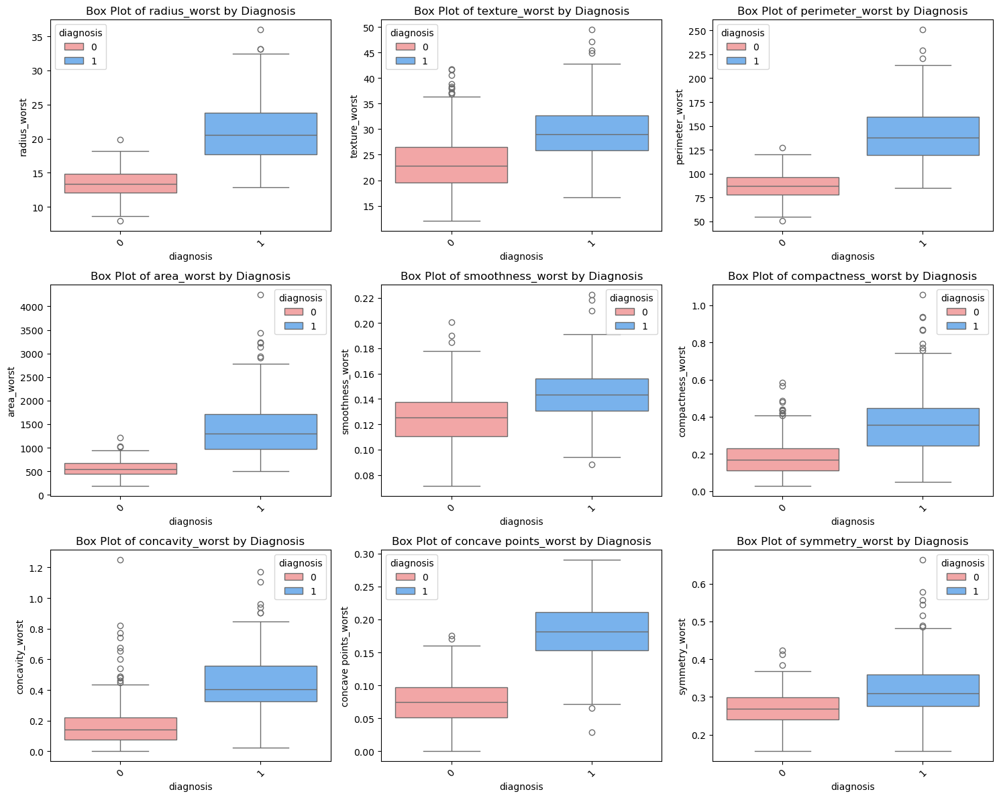

Number of outliers detected: 26
Outlier indices: [108, 265, 190, 3, 379, 9, 562, 352, 236, 272, 23, 180, 212, 219, 82, 26, 461, 368, 369, 339, 181, 0, 503, 15, 567, 521]


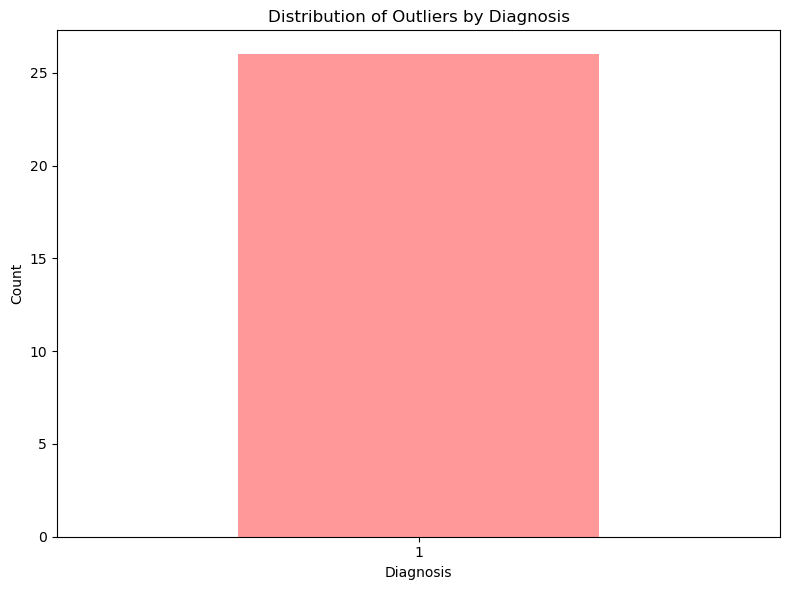

In [26]:
# Aykırı değerleri belirlemek için worst özellikler için kutu grafikleri çizelim
plot_boxplots(data, worst_features[:-1], 3, 3, figsize=(15, 12))

# worst özellikler için uç değerleri alın
worst_outliers = detect_outliers_iqr(data, worst_features[:-1])

print(f"Number of outliers detected: {len(worst_outliers)}")
print("Outlier indices:", worst_outliers)

# diagnosis göre aykırı değerlerin dağılımını görselleştirin
if len(worst_outliers) > 0:
    outlier_diagnosis = data.loc[worst_outliers, 'diagnosis'].value_counts()
    plt.figure(figsize=(8, 6))
    outlier_diagnosis.plot(kind='bar', color=colors)
    plt.title('Distribution of Outliers by Diagnosis')
    plt.xlabel('Diagnosis')
    plt.ylabel('Count')
    plt.xticks(rotation=0)
    plt.tight_layout()
    plt.show()

In [27]:
# Tüm aykırı değerleri birleştirin
all_outliers = set(mean_outliers + se_outliers + worst_outliers)
all_outliers = list(all_outliers)

print(f"Total unique outlier indices: {len(all_outliers)}")
print(f"Outlier indices: {sorted(all_outliers)}")

# Veri setinin orijinal boyutunu ve aykırı değerleri kaldırmadan önceki durumu kontrol edin
print(f"\nOriginal data shape: {data.shape}")

# Aykırı değerleri kaldırın
data_cleaned = data.drop(index=all_outliers)

# Veri setini yeniden indeksleyin
data_cleaned = data_cleaned.reset_index(drop=True)

print(f"Cleaned data shape: {data_cleaned.shape}")
print(f"Number of rows removed: {data.shape[0] - data_cleaned.shape[0]}")

# Hedef değişkenin (diagnosis) dağılımını temizlenmiş veri setinde kontrol edin
print(f"\nDiagnosis distribution after cleaning:")
cleaned_diagnosis_counts = data_cleaned['diagnosis'].value_counts()
print(cleaned_diagnosis_counts)
print("\nPercentage distribution:")
print(cleaned_diagnosis_counts / len(data_cleaned) * 100)

# Temizlenmiş veri setini kullanın
data = data_cleaned.copy()

print(f"\nFinal data shape: {data.shape}")

Total unique outlier indices: 66
Outlier indices: [0, 3, 9, 12, 15, 23, 25, 26, 38, 42, 68, 71, 77, 78, 82, 108, 112, 116, 122, 138, 152, 161, 164, 168, 176, 180, 181, 190, 202, 210, 212, 213, 218, 219, 236, 250, 258, 265, 272, 288, 290, 300, 302, 314, 339, 345, 351, 352, 366, 368, 369, 376, 379, 388, 417, 460, 461, 468, 485, 503, 521, 539, 562, 563, 564, 567]

Original data shape: (569, 31)
Cleaned data shape: (503, 31)
Number of rows removed: 66

Diagnosis distribution after cleaning:
diagnosis
0    343
1    160
Name: count, dtype: int64

Percentage distribution:
diagnosis
0    68.190855
1    31.809145
Name: count, dtype: float64

Final data shape: (503, 31)


In [28]:
data.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.8,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
1,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.5,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
2,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.2,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678
3,1,12.45,15.70,82.57,477.1,0.12780,0.17000,0.1578,0.08089,0.2087,...,15.47,23.75,103.4,741.6,0.1791,0.5249,0.5355,0.1741,0.3985,0.12440
4,1,18.25,19.98,119.60,1040.0,0.09463,0.10900,0.1127,0.07400,0.1794,...,22.88,27.66,153.2,1606.0,0.1442,0.2576,0.3784,0.1932,0.3063,0.08368


## 2.4 Yüksek oranda ilişkili özelliklerin kaldırılması

In [29]:
# Yüksek korelasyona sahip özellikleri kaldırma
def remove_highly_correlated_features(df, threshold=0.90):
    """
    Yüksek korelasyona sahip özellikleri kaldırır
    """
    # Sadece sayısal sütunları al (diagnosis hariç)
    numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns.tolist()
    if 'diagnosis' in numeric_cols:
        numeric_cols.remove('diagnosis')
    
    # Korelasyon matrisini hesapla
    corr_matrix = df[numeric_cols].corr().abs()
    
    # Üst üçgen matrisi al (kendisiyle korelasyonu hariç)
    upper_triangle = corr_matrix.where(
        np.triu(np.ones(corr_matrix.shape), k=1).astype(bool)
    )
    
    # Yüksek korelasyona sahip özellikleri bul
    high_corr_features = [column for column in upper_triangle.columns 
                         if any(upper_triangle[column] > threshold)]
    
    print(f"Eşik değeri: {threshold}")
    print(f"Kaldırılacak özellik sayısı: {len(high_corr_features)}")
    print(f"Kaldırılacak özellikler: {high_corr_features}")
    
    # Yüksek korelasyonlu özellikleri kaldır
    df_reduced = df.drop(columns=high_corr_features)
    
    print(f"\nÖnceki özellik sayısı: {len(df.columns)}")
    print(f"Sonraki özellik sayısı: {len(df_reduced.columns)}")
    print(f"Kaldırılan özellik sayısı: {len(high_corr_features)}")
    
    return df_reduced, high_corr_features

# Yüksek korelasyonlu özellikleri kaldır
data_reduced, removed_features = remove_highly_correlated_features(data, threshold=0.90)

print(f"\nKalan özellikler:")
print(data_reduced.columns.tolist())

Eşik değeri: 0.9
Kaldırılacak özellik sayısı: 11
Kaldırılacak özellikler: ['perimeter_mean', 'area_mean', 'concave points_mean', 'perimeter_se', 'area_se', 'radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst', 'concavity_worst', 'concave points_worst']

Önceki özellik sayısı: 31
Sonraki özellik sayısı: 20
Kaldırılan özellik sayısı: 11

Kalan özellikler:
['diagnosis', 'radius_mean', 'texture_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se', 'fractal_dimension_se', 'smoothness_worst', 'compactness_worst', 'symmetry_worst', 'fractal_dimension_worst']


In [30]:
data = data_reduced.copy()

print(f"\nSon veri seti boyutu: {data.shape}")
data.head()


Son veri seti boyutu: (503, 20)


,diagnosis,radius_mean,texture_mean,smoothness_mean,compactness_mean,concavity_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,smoothness_worst,compactness_worst,symmetry_worst,fractal_dimension_worst
0,1,20.57,17.77,0.08474,0.07864,0.0869,0.1812,0.05667,0.5435,0.7339,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,0.1238,0.1866,0.2750,0.08902
1,1,19.69,21.25,0.10960,0.15990,0.1974,0.2069,0.05999,0.7456,0.7869,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,0.1444,0.4245,0.3613,0.08758
2,1,20.29,14.34,0.10030,0.13280,0.1980,0.1809,0.05883,0.7572,0.7813,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,0.1374,0.2050,0.2364,0.07678
3,1,12.45,15.70,0.12780,0.17000,0.1578,0.2087,0.07613,0.3345,0.8902,0.007510,0.03345,0.03672,0.01137,0.02165,0.005082,0.1791,0.5249,0.3985,0.12440
4,1,18.25,19.98,0.09463,0.10900,0.1127,0.1794,0.05742,0.4467,0.7732,0.004314,0.01382,0.02254,0.01039,0.01369,0.002179,0.1442,0.2576,0.3063,0.08368


## 2.5 Verileri eğitim ve test olarak ayırma

In [31]:
from sklearn.model_selection import train_test_split

# Özellikler (X) ve hedef değişken (y) ayırma
X = data.drop('diagnosis', axis=1)
y = data['diagnosis']

# Verileri %80 eğitim, %20 test olarak ayırma
X_train, X_test, y_train, y_test = train_test_split(
    X, y, 
    test_size=0.2, 
    random_state=42, 
    stratify=y  # Sınıf dengesini korumak için
)

print("Eğitim seti boyutu:", X_train.shape)
print("Test seti boyutu:", X_test.shape)
print("\nEğitim seti hedef değişken dağılımı:")
print(y_train.value_counts())
print("\nTest seti hedef değişken dağılımı:")
print(y_test.value_counts())

# Yüzdelik dağılımları kontrol et
print("\nEğitim seti yüzdelik dağılım:")
print(y_train.value_counts(normalize=True) * 100)
print("\nTest seti yüzdelik dağılım:")
print(y_test.value_counts(normalize=True) * 100)

Eğitim seti boyutu: (402, 19)
Test seti boyutu: (101, 19)

Eğitim seti hedef değişken dağılımı:
diagnosis
0    274
1    128
Name: count, dtype: int64

Test seti hedef değişken dağılımı:
diagnosis
0    69
1    32
Name: count, dtype: int64

Eğitim seti yüzdelik dağılım:
diagnosis
0    68.159204
1    31.840796
Name: proportion, dtype: float64

Test seti yüzdelik dağılım:
diagnosis
0    68.316832
1    31.683168
Name: proportion, dtype: float64


## 2.6 Özellik normalizasyonu

In [32]:
from sklearn.preprocessing import StandardScaler

# StandardScaler ile verileri normalize et
scaler = StandardScaler()

# Eğitim verilerini normalize et ve scaler'ı fit et
X_train = scaler.fit_transform(X_train)

# Test verilerini aynı scaler ile normalize et
X_test = scaler.transform(X_test)

print("Normalizasyon tamamlandı!")
print(f"Eğitim seti shape: {X_train.shape}")
print(f"Test seti shape: {X_test.shape}")

Normalizasyon tamamlandı!
Eğitim seti shape: (402, 19)
Test seti shape: (101, 19)


## 2.7 Dengesiz Eğitim Veri Seti için SMOTE Tekniğini Uygula

In [33]:
from imblearn.over_sampling import SMOTE

# SMOTE uygulama
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

print("SMOTE öncesi eğitim seti boyutu:", X_train.shape)
print("SMOTE sonrası eğitim seti boyutu:", X_train_smote.shape)

print("\nSMOTE öncesi hedef değişken dağılımı:")
print(y_train.value_counts())
print("\nSMOTE sonrası hedef değişken dağılımı:")
print(y_train_smote.value_counts())

# Yüzdelik dağılımları kontrol et
print("\nSMOTE öncesi yüzdelik dağılım:")
print(y_train.value_counts(normalize=True) * 100)
print("\nSMOTE sonrası yüzdelik dağılım:")
print(pd.Series(y_train_smote).value_counts(normalize=True) * 100)

SMOTE öncesi eğitim seti boyutu: (402, 19)
SMOTE sonrası eğitim seti boyutu: (548, 19)

SMOTE öncesi hedef değişken dağılımı:
diagnosis
0    274
1    128
Name: count, dtype: int64

SMOTE sonrası hedef değişken dağılımı:
diagnosis
0    274
1    274
Name: count, dtype: int64

SMOTE öncesi yüzdelik dağılım:
diagnosis
0    68.159204
1    31.840796
Name: proportion, dtype: float64

SMOTE sonrası yüzdelik dağılım:
diagnosis
0    50.0
1    50.0
Name: proportion, dtype: float64


# 3. Geleneksel Makine Öğrenmesi Modelleri

## 3.1 Logistic Regression

In [34]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
import seaborn as sns
import numpy as np

import matplotlib.pyplot as plt

# Logistic Regression modelini oluştur
lr_model = LogisticRegression(random_state=42, max_iter=1000)

# Modeli eğit (SMOTE uygulanmış veri ile)
lr_model.fit(X_train_smote, y_train_smote)

# Test seti üzerinde tahmin yap
y_pred_lr = lr_model.predict(X_test)

# Model performansını değerlendir
accuracy_lr = accuracy_score(y_test, y_pred_lr)
conf_matrix_lr = confusion_matrix(y_test, y_pred_lr)
class_report_lr = classification_report(y_test, y_pred_lr)

Logistic Regression Model Performansı:
Accuracy: 0.9802

Confusion Matrix:
[[69  0]
 [ 2 30]]

Classification Report:
              precision    recall  f1-score   support

           0       0.97      1.00      0.99        69
           1       1.00      0.94      0.97        32

    accuracy                           0.98       101
   macro avg       0.99      0.97      0.98       101
weighted avg       0.98      0.98      0.98       101



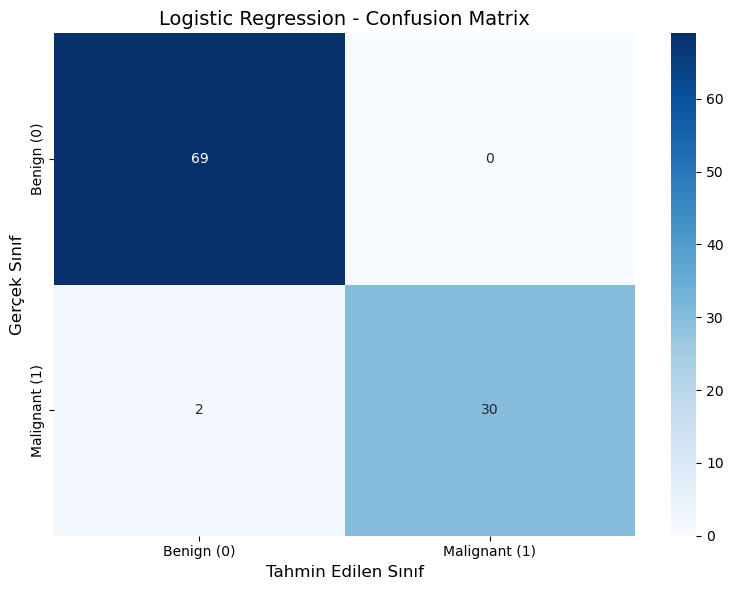

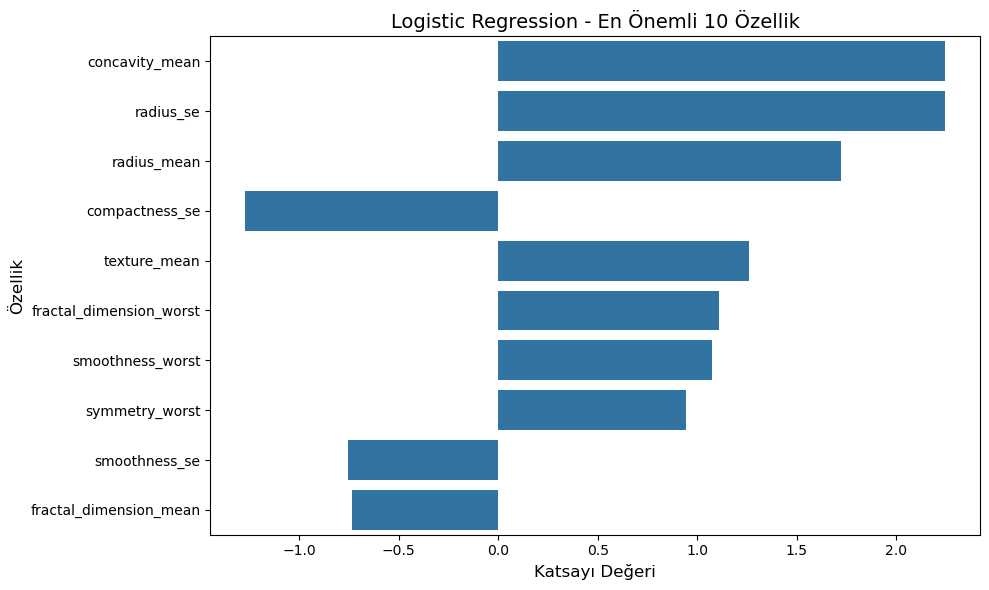

In [35]:
# Sonuçları yazdır
print(f"Logistic Regression Model Performansı:")
print(f"Accuracy: {accuracy_lr:.4f}")
print("\nConfusion Matrix:")
print(conf_matrix_lr)
print("\nClassification Report:")
print(class_report_lr)

# Confusion Matrix görselleştirme
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_lr, annot=True, fmt='d', cmap='Blues', 
            xticklabels=['Benign (0)', 'Malignant (1)'],
            yticklabels=['Benign (0)', 'Malignant (1)'])
plt.title('Logistic Regression - Confusion Matrix', fontsize=14)
plt.xlabel('Tahmin Edilen Sınıf', fontsize=12)
plt.ylabel('Gerçek Sınıf', fontsize=12)
plt.tight_layout()
plt.show()

# Modelin katsayılarını görselleştir
feature_names = X.columns if hasattr(X, 'columns') else [f'Feature {i}' for i in range(X.shape[1])]
coefficients = pd.DataFrame({
    'Feature': feature_names,
    'Coefficient': lr_model.coef_[0]
})

# Katsayıları mutlak değerlerine göre sırala
coefficients = coefficients.reindex(coefficients['Coefficient'].abs().sort_values(ascending=False).index)

# En önemli 10 özelliği görselleştir
plt.figure(figsize=(10, 6))
sns.barplot(x='Coefficient', y='Feature', data=coefficients.head(10))
plt.title('Logistic Regression - En Önemli 10 Özellik', fontsize=14)
plt.xlabel('Katsayı Değeri', fontsize=12)
plt.ylabel('Özellik', fontsize=12)
plt.tight_layout()
plt.show()

## 3.2 Random Forest

In [36]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
import seaborn as sns

import matplotlib.pyplot as plt

# Random Forest modelini oluştur
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)

# Modeli eğit (SMOTE uygulanmış veri ile)
rf_model.fit(X_train_smote, y_train_smote)

# Test seti üzerinde tahmin yap
y_pred_rf = rf_model.predict(X_test)

Random Forest Model Performansı:
Accuracy: 0.9505

Confusion Matrix:
[[67  2]
 [ 3 29]]

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.97      0.96        69
           1       0.94      0.91      0.92        32

    accuracy                           0.95       101
   macro avg       0.95      0.94      0.94       101
weighted avg       0.95      0.95      0.95       101



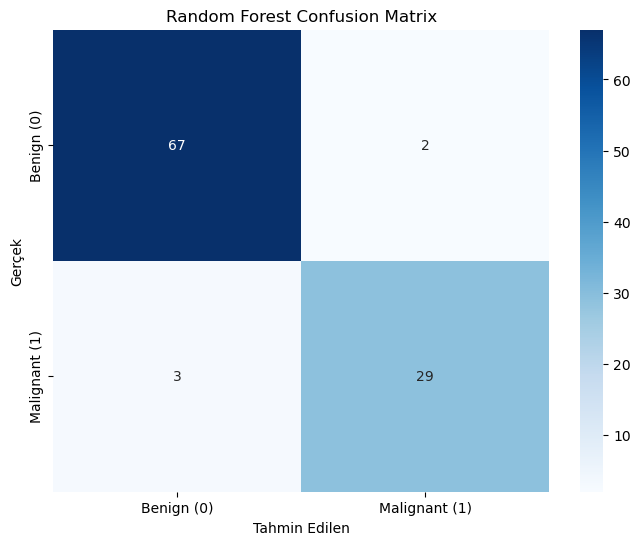

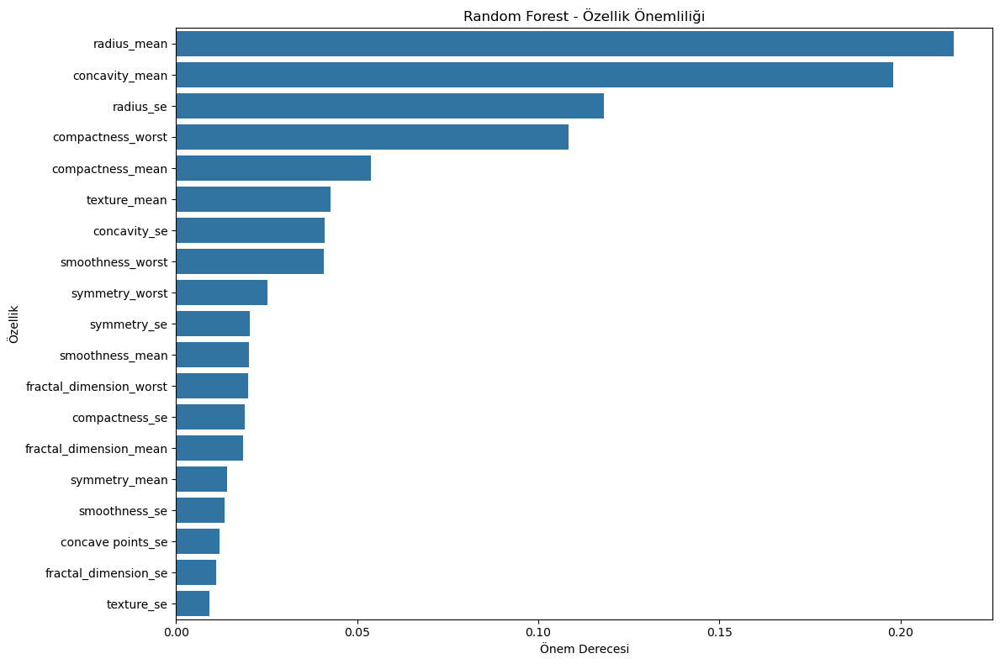

In [37]:
# Model performansını değerlendir
accuracy_rf = accuracy_score(y_test, y_pred_rf)
conf_matrix_rf = confusion_matrix(y_test, y_pred_rf)
class_report_rf = classification_report(y_test, y_pred_rf)

# Sonuçları yazdır
print(f"Random Forest Model Performansı:")
print(f"Accuracy: {accuracy_rf:.4f}")

print("\nConfusion Matrix:")
print(conf_matrix_rf)

print("\nClassification Report:")
print(class_report_rf)

# Confusion Matrix görselleştir
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_rf, annot=True, fmt='d', cmap='Blues', 
            xticklabels=['Benign (0)', 'Malignant (1)'],
            yticklabels=['Benign (0)', 'Malignant (1)'])
plt.xlabel('Tahmin Edilen')
plt.ylabel('Gerçek')
plt.title('Random Forest Confusion Matrix')
plt.show()

# Özellik önemliliklerini görselleştir
feature_importance = pd.DataFrame({
    'feature': X.columns,
    'importance': rf_model.feature_importances_
})
feature_importance = feature_importance.sort_values('importance', ascending=False)

plt.figure(figsize=(12, 8))
sns.barplot(x='importance', y='feature', data=feature_importance)
plt.title('Random Forest - Özellik Önemliliği')
plt.xlabel('Önem Derecesi')
plt.ylabel('Özellik')
plt.tight_layout()
plt.show()

## 3.3 Support Vector Machine (SVM)

Fitting 5 folds for each of 32 candidates, totalling 160 fits
En iyi parametreler: {'C': 0.1, 'gamma': 0.01, 'kernel': 'linear'}
En iyi çapraz doğrulama skoru: 0.9800
SVM Grid Search ve eğitim süresi: 17.14 saniye

SVM Model Performansı:
Accuracy: 0.9703

Confusion Matrix:
[[69  0]
 [ 3 29]]

Classification Report:
              precision    recall  f1-score   support

           0       0.96      1.00      0.98        69
           1       1.00      0.91      0.95        32

    accuracy                           0.97       101
   macro avg       0.98      0.95      0.96       101
weighted avg       0.97      0.97      0.97       101



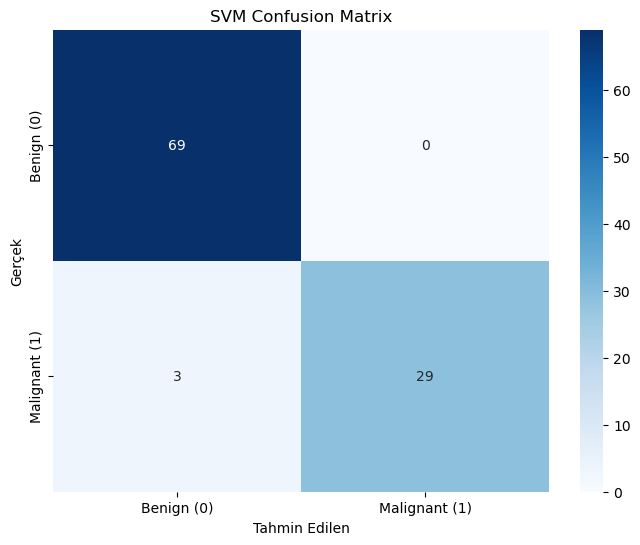

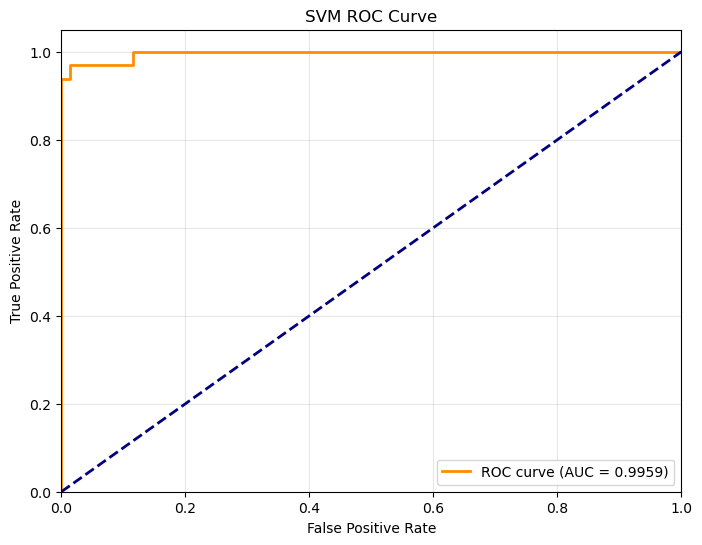

In [38]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, roc_curve, auc
import seaborn as sns
import numpy as np
import time

import matplotlib.pyplot as plt

# Başlangıç zamanını kaydet
start_time = time.time()

# Parametre ızgarası oluştur
param_grid = {
    'C': [0.1, 1, 10, 100],
    'gamma': [0.01, 0.1, 'scale', 'auto'],
    'kernel': ['rbf', 'linear']
}

# GridSearchCV ile en iyi parametreleri bul
grid_search = GridSearchCV(
    SVC(probability=True, random_state=42),
    param_grid=param_grid,
    cv=5,
    scoring='accuracy',
    n_jobs=-1,
    verbose=1
)

# Modeli eğit (SMOTE uygulanmış veri ile)
grid_search.fit(X_train_smote, y_train_smote)

# En iyi parametreleri ve skoru görüntüle
print(f"En iyi parametreler: {grid_search.best_params_}")
print(f"En iyi çapraz doğrulama skoru: {grid_search.best_score_:.4f}")

# En iyi modeli al
best_svm_model = grid_search.best_estimator_

# Test seti üzerinde tahmin yap
y_pred_svm = best_svm_model.predict(X_test)
y_prob_svm = best_svm_model.predict_proba(X_test)[:, 1]

# Model performansını değerlendir
accuracy_svm = accuracy_score(y_test, y_pred_svm)
conf_matrix_svm = confusion_matrix(y_test, y_pred_svm)
class_report_svm = classification_report(y_test, y_pred_svm)

# Geçen süreyi hesapla
end_time = time.time()
elapsed_time = end_time - start_time
print(f"SVM Grid Search ve eğitim süresi: {elapsed_time:.2f} saniye")

# Sonuçları yazdır
print(f"\nSVM Model Performansı:")
print(f"Accuracy: {accuracy_svm:.4f}")

print("\nConfusion Matrix:")
print(conf_matrix_svm)

print("\nClassification Report:")
print(class_report_svm)

# Confusion Matrix görselleştir
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_svm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=['Benign (0)', 'Malignant (1)'],
            yticklabels=['Benign (0)', 'Malignant (1)'])
plt.xlabel('Tahmin Edilen')
plt.ylabel('Gerçek')
plt.title('SVM Confusion Matrix')
plt.show()

# ROC eğrisi çiz
fpr, tpr, _ = roc_curve(y_test, y_prob_svm)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('SVM ROC Curve')
plt.legend(loc="lower right")
plt.grid(True, alpha=0.3)
plt.show()

## 3.4 K-Nearest Neighbors (KNN)

Fitting 5 folds for each of 42 candidates, totalling 210 fits
En iyi parametreler: {'metric': 'manhattan', 'n_neighbors': 3, 'weights': 'distance'}
En iyi çapraz doğrulama skoru: 0.9708
KNN Grid Search ve eğitim süresi: 1.83 saniye

KNN Model Performansı:
Accuracy: 0.9307

Confusion Matrix:
[[65  4]
 [ 3 29]]

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.94      0.95        69
           1       0.88      0.91      0.89        32

    accuracy                           0.93       101
   macro avg       0.92      0.92      0.92       101
weighted avg       0.93      0.93      0.93       101



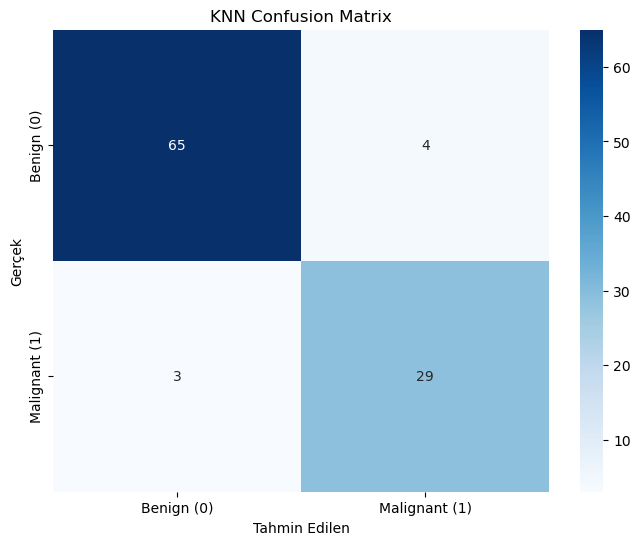

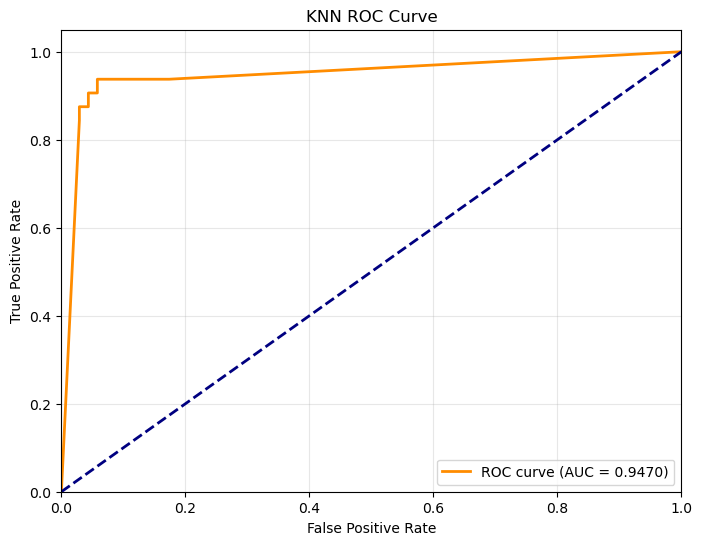

In [39]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, roc_curve, auc
import seaborn as sns
import numpy as np
import time

import matplotlib.pyplot as plt

# Başlangıç zamanını kaydet
start_time = time.time()

# Parametre ızgarası oluştur
param_grid = {
    'n_neighbors': [3, 5, 7, 9, 11, 13, 15],
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan', 'minkowski']
}

# GridSearchCV ile en iyi parametreleri bul
grid_search = GridSearchCV(
    KNeighborsClassifier(),
    param_grid=param_grid,
    cv=5,
    scoring='accuracy',
    n_jobs=-1,
    verbose=1
)

# Modeli eğit (SMOTE uygulanmış veri ile)
grid_search.fit(X_train_smote, y_train_smote)

# En iyi parametreleri ve skoru görüntüle
print(f"En iyi parametreler: {grid_search.best_params_}")
print(f"En iyi çapraz doğrulama skoru: {grid_search.best_score_:.4f}")

# En iyi modeli al
best_knn_model = grid_search.best_estimator_

# Test seti üzerinde tahmin yap
y_pred_knn = best_knn_model.predict(X_test)
y_prob_knn = best_knn_model.predict_proba(X_test)[:, 1]

# Model performansını değerlendir
accuracy_knn = accuracy_score(y_test, y_pred_knn)
conf_matrix_knn = confusion_matrix(y_test, y_pred_knn)
class_report_knn = classification_report(y_test, y_pred_knn)

# Geçen süreyi hesapla
end_time = time.time()
elapsed_time = end_time - start_time
print(f"KNN Grid Search ve eğitim süresi: {elapsed_time:.2f} saniye")

# Sonuçları yazdır
print(f"\nKNN Model Performansı:")
print(f"Accuracy: {accuracy_knn:.4f}")

print("\nConfusion Matrix:")
print(conf_matrix_knn)

print("\nClassification Report:")
print(class_report_knn)

# Confusion Matrix görselleştir
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_knn, annot=True, fmt='d', cmap='Blues', 
            xticklabels=['Benign (0)', 'Malignant (1)'],
            yticklabels=['Benign (0)', 'Malignant (1)'])
plt.xlabel('Tahmin Edilen')
plt.ylabel('Gerçek')
plt.title('KNN Confusion Matrix')
plt.show()

# ROC eğrisi çiz
fpr, tpr, _ = roc_curve(y_test, y_prob_knn)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('KNN ROC Curve')
plt.legend(loc="lower right")
plt.grid(True, alpha=0.3)
plt.show()

## 3.5 Gradient Boosting (XGBoost, LightGBM)

Fitting 5 folds for each of 216 candidates, totalling 1080 fits


c:\Users\ilgar\miniconda3\envs\baykar\Lib\site-packages\xgboost\training.py:183: UserWarning: [00:38:54] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


En iyi parametreler: {'colsample_bytree': 0.8, 'gamma': 0.1, 'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 200, 'subsample': 0.8}
En iyi çapraz doğrulama skoru: 0.9762
XGBoost Grid Search ve eğitim süresi: 102.57 saniye

XGBoost Model Performansı:
Accuracy: 0.9604

Confusion Matrix:
[[66  3]
 [ 1 31]]

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.96      0.97        69
           1       0.91      0.97      0.94        32

    accuracy                           0.96       101
   macro avg       0.95      0.96      0.95       101
weighted avg       0.96      0.96      0.96       101



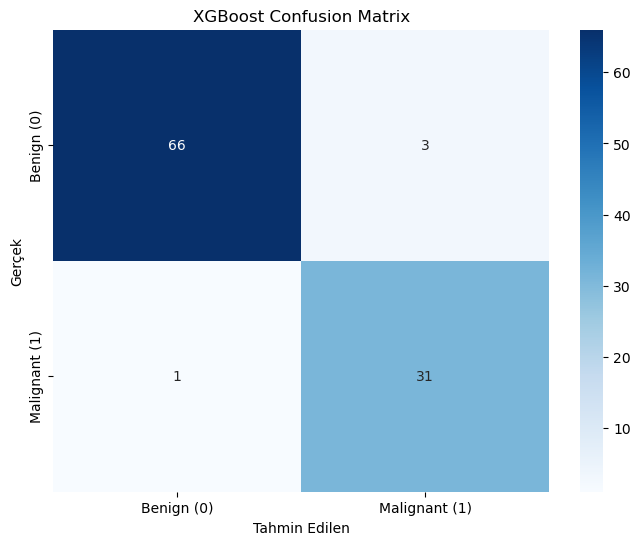

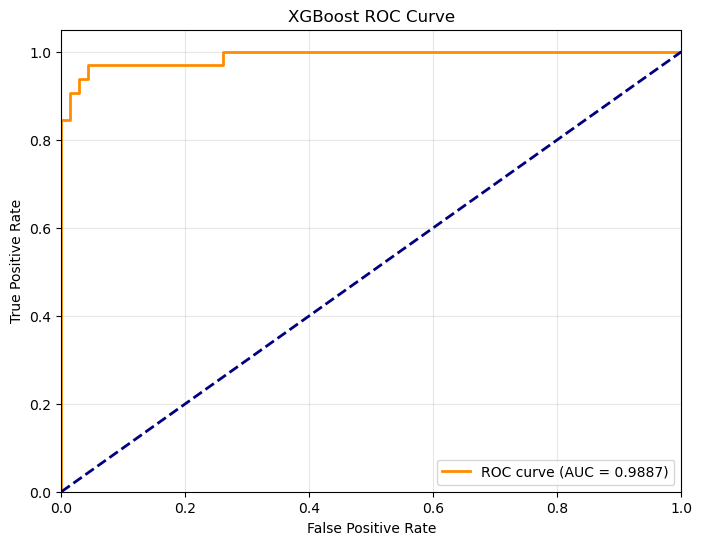

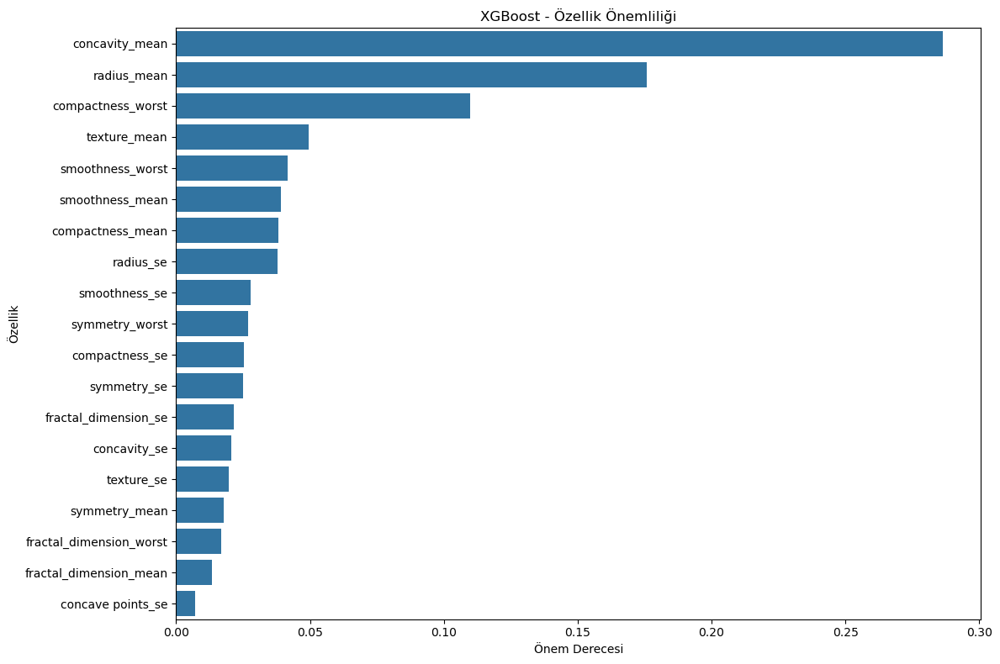

In [40]:
import xgboost as xgb
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, roc_curve, auc
import seaborn as sns
import time
import numpy as np

import matplotlib.pyplot as plt

# Başlangıç zamanını kaydet
start_time = time.time()

# XGBoost için parametre ızgarası oluştur
param_grid = {
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2],
    'n_estimators': [100, 200],
    'gamma': [0, 0.1, 0.2],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

# GridSearchCV ile en iyi parametreleri bul
grid_search = GridSearchCV(
    xgb.XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42),
    param_grid=param_grid,
    cv=5,
    scoring='accuracy',
    n_jobs=-1,
    verbose=1
)

# Modeli eğit (SMOTE uygulanmış veri ile)
grid_search.fit(X_train_smote, y_train_smote)

# En iyi parametreleri ve skoru görüntüle
print(f"En iyi parametreler: {grid_search.best_params_}")
print(f"En iyi çapraz doğrulama skoru: {grid_search.best_score_:.4f}")

# En iyi modeli al
best_xgb_model = grid_search.best_estimator_

# Test seti üzerinde tahmin yap
y_pred_xgb = best_xgb_model.predict(X_test)
y_prob_xgb = best_xgb_model.predict_proba(X_test)[:, 1]

# Model performansını değerlendir
accuracy_xgb = accuracy_score(y_test, y_pred_xgb)
conf_matrix_xgb = confusion_matrix(y_test, y_pred_xgb)
class_report_xgb = classification_report(y_test, y_pred_xgb)

# Geçen süreyi hesapla
end_time = time.time()
elapsed_time = end_time - start_time
print(f"XGBoost Grid Search ve eğitim süresi: {elapsed_time:.2f} saniye")

# Sonuçları yazdır
print(f"\nXGBoost Model Performansı:")
print(f"Accuracy: {accuracy_xgb:.4f}")

print("\nConfusion Matrix:")
print(conf_matrix_xgb)

print("\nClassification Report:")
print(class_report_xgb)

# Confusion Matrix görselleştir
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_xgb, annot=True, fmt='d', cmap='Blues', 
            xticklabels=['Benign (0)', 'Malignant (1)'],
            yticklabels=['Benign (0)', 'Malignant (1)'])
plt.xlabel('Tahmin Edilen')
plt.ylabel('Gerçek')
plt.title('XGBoost Confusion Matrix')
plt.show()

# ROC eğrisi çiz
fpr, tpr, _ = roc_curve(y_test, y_prob_xgb)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('XGBoost ROC Curve')
plt.legend(loc="lower right")
plt.grid(True, alpha=0.3)
plt.show()

# Özellik önemliliklerini görselleştir
feature_names = X.columns
feature_importance = pd.DataFrame({
    'feature': feature_names,
    'importance': best_xgb_model.feature_importances_
})
feature_importance = feature_importance.sort_values('importance', ascending=False)

plt.figure(figsize=(12, 8))
sns.barplot(x='importance', y='feature', data=feature_importance)
plt.title('XGBoost - Özellik Önemliliği')
plt.xlabel('Önem Derecesi')
plt.ylabel('Özellik')
plt.tight_layout()
plt.show()

Fitting 5 folds for each of 216 candidates, totalling 1080 fits
En iyi parametreler: {'colsample_bytree': 0.8, 'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 200, 'num_leaves': 31, 'subsample': 0.8}
En iyi çapraz doğrulama skoru: 0.9781
LightGBM Grid Search ve eğitim süresi: 146.28 saniye

LightGBM Model Performansı:
Accuracy: 0.9406

Confusion Matrix:
[[67  2]
 [ 4 28]]

Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.97      0.96        69
           1       0.93      0.88      0.90        32

    accuracy                           0.94       101
   macro avg       0.94      0.92      0.93       101
weighted avg       0.94      0.94      0.94       101



c:\Users\ilgar\miniconda3\envs\baykar\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
c:\Users\ilgar\miniconda3\envs\baykar\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


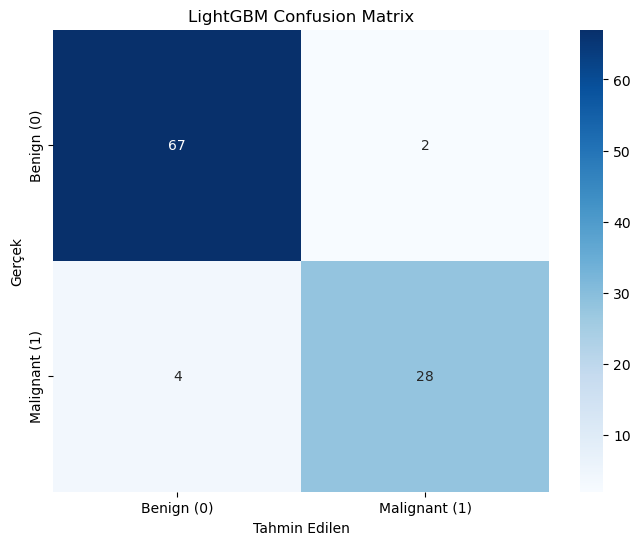

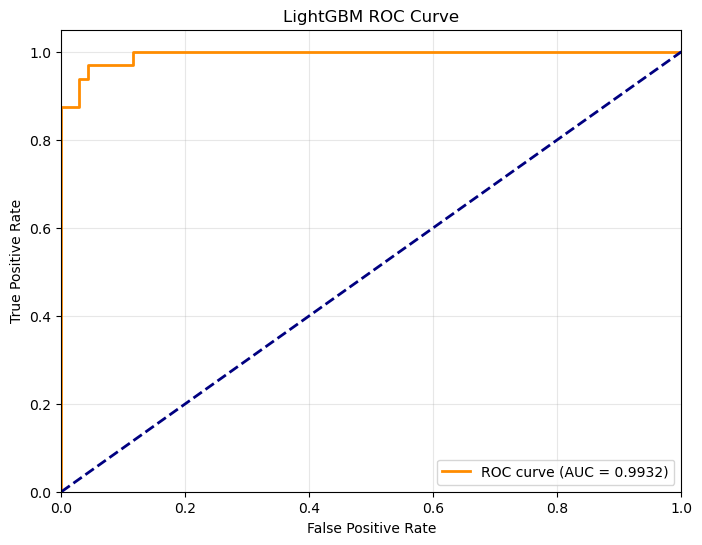

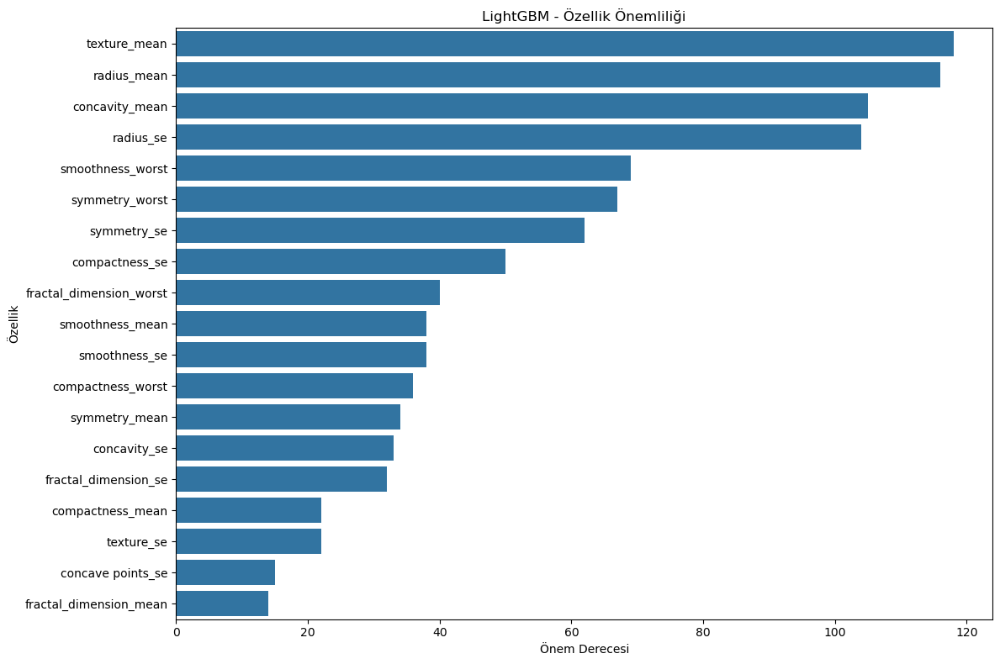

In [41]:
import lightgbm as lgb
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, roc_curve, auc
import seaborn as sns
import time
import numpy as np

import matplotlib.pyplot as plt

# Başlangıç zamanını kaydet
start_time = time.time()

# LightGBM için parametre ızgarası oluştur
param_grid = {
    'num_leaves': [31, 50, 100],
    'learning_rate': [0.01, 0.1, 0.2],
    'n_estimators': [100, 200],
    'max_depth': [3, 5, 7],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

# GridSearchCV ile en iyi parametreleri bul
grid_search = GridSearchCV(
    lgb.LGBMClassifier(random_state=42, verbose=-1),
    param_grid=param_grid,
    cv=5,
    scoring='accuracy',
    n_jobs=-1,
    verbose=1
)

# Modeli eğit (SMOTE uygulanmış veri ile)
grid_search.fit(X_train_smote, y_train_smote)

# En iyi parametreleri ve skoru görüntüle
print(f"En iyi parametreler: {grid_search.best_params_}")
print(f"En iyi çapraz doğrulama skoru: {grid_search.best_score_:.4f}")

# En iyi modeli al
best_lgb_model = grid_search.best_estimator_

# Test seti üzerinde tahmin yap
y_pred_lgb = best_lgb_model.predict(X_test)
y_prob_lgb = best_lgb_model.predict_proba(X_test)[:, 1]

# Model performansını değerlendir
accuracy_lgb = accuracy_score(y_test, y_pred_lgb)
conf_matrix_lgb = confusion_matrix(y_test, y_pred_lgb)
class_report_lgb = classification_report(y_test, y_pred_lgb)

# Geçen süreyi hesapla
end_time = time.time()
elapsed_time = end_time - start_time
print(f"LightGBM Grid Search ve eğitim süresi: {elapsed_time:.2f} saniye")

# Sonuçları yazdır
print(f"\nLightGBM Model Performansı:")
print(f"Accuracy: {accuracy_lgb:.4f}")

print("\nConfusion Matrix:")
print(conf_matrix_lgb)

print("\nClassification Report:")
print(class_report_lgb)

# Confusion Matrix görselleştir
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_lgb, annot=True, fmt='d', cmap='Blues', 
            xticklabels=['Benign (0)', 'Malignant (1)'],
            yticklabels=['Benign (0)', 'Malignant (1)'])
plt.xlabel('Tahmin Edilen')
plt.ylabel('Gerçek')
plt.title('LightGBM Confusion Matrix')
plt.show()

# ROC eğrisi çiz
fpr, tpr, _ = roc_curve(y_test, y_prob_lgb)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('LightGBM ROC Curve')
plt.legend(loc="lower right")
plt.grid(True, alpha=0.3)
plt.show()

# Özellik önemliliklerini görselleştir
feature_names = X.columns
feature_importance = pd.DataFrame({
    'feature': feature_names,
    'importance': best_lgb_model.feature_importances_
})
feature_importance = feature_importance.sort_values('importance', ascending=False)

plt.figure(figsize=(12, 8))
sns.barplot(x='importance', y='feature', data=feature_importance)
plt.title('LightGBM - Özellik Önemliliği')
plt.xlabel('Önem Derecesi')
plt.ylabel('Özellik')
plt.tight_layout()
plt.show()

# 4.Derin Öğrenme Modelleri

In [42]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
import seaborn as sns
import numpy as np

import matplotlib.pyplot as plt

# Model mimarisini oluştur
model = Sequential([
    Dense(128, activation='relu', input_shape=(X_train_smote.shape[1],)),
    Dropout(0.5),
    Dense(64, activation='relu'),
    Dropout(0.5),
    Dense(1, activation='sigmoid')  # İkili sınıflandırma için sigmoid aktivasyonu
])

# Modeli derle
model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Model özetini yazdır
model.summary()


c:\Users\ilgar\miniconda3\envs\baykar\Lib\site-packages\keras\src\layers\core\dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 128)            │         2,560 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 10,881 (42.50 KB)

 Trainable params: 10,881 (42.50 KB)

 Non-trainable params: 0 (0.00 B)

In [43]:
# Modeli eğit
history = model.fit(X_train_smote, y_train_smote,
                    epochs=100,  # Epoch sayısını artırabilirsiniz
                    batch_size=32,
                    validation_split=0.2,  # Eğitim verisinin bir kısmını doğrulama için kullan
                    callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)],
                    verbose=1)

Epoch 1/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 4s 45ms/step - accuracy: 0.5357 - loss: 0.7250 - val_accuracy: 0.9091 - val_loss: 0.4615
Epoch 2/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.7959 - loss: 0.4617 - val_accuracy: 0.9091 - val_loss: 0.3411
Epoch 3/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - accuracy: 0.8644 - loss: 0.3645 - val_accuracy: 0.9091 - val_loss: 0.2931
Epoch 4/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - accuracy: 0.9017 - loss: 0.2643 - val_accuracy: 0.9091 - val_loss: 0.2332
Epoch 5/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.9279 - loss: 0.2196 - val_accuracy: 0.9182 - val_loss: 0.1895
Epoch 6/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9420 - loss: 0.1929 - val_accuracy: 0.9636 - val_loss: 0.1405
Epoch 7/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.9665 - loss: 0.1593 - val_accuracy: 0.9636 - val_loss: 0.1068
Epoch 8/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.9435 - loss: 0.1756 - val_accuracy: 0.

In [44]:
# Model performansını test seti üzerinde değerlendir
loss, accuracy_dl = model.evaluate(X_test, y_test, verbose=0)
print(f"\nDeep Learning Model Performansı:")
print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy_dl:.4f}")

# Test seti üzerinde tahmin yap
y_pred_prob_dl = model.predict(X_test)
y_pred_dl = (y_pred_prob_dl > 0.5).astype(int).flatten() # Olasılıkları sınıflara dönüştür

# Confusion matrix ve classification report
conf_matrix_dl = confusion_matrix(y_test, y_pred_dl)
class_report_dl = classification_report(y_test, y_pred_dl)

print("\nConfusion Matrix:")
print(conf_matrix_dl)
print("\nClassification Report:")
print(class_report_dl)


Deep Learning Model Performansı:
Test Loss: 0.0721
Test Accuracy: 0.9901
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step

Confusion Matrix:
[[69  0]
 [ 1 31]]

Classification Report:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99        69
           1       1.00      0.97      0.98        32

    accuracy                           0.99       101
   macro avg       0.99      0.98      0.99       101
weighted avg       0.99      0.99      0.99       101



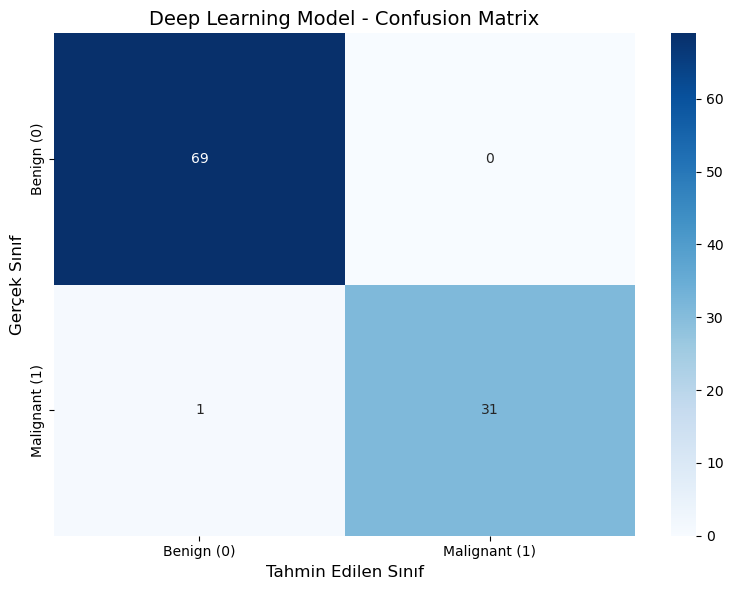

In [45]:
# Confusion Matrix görselleştir
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_dl, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Benign (0)', 'Malignant (1)'],
            yticklabels=['Benign (0)', 'Malignant (1)'])
plt.title('Deep Learning Model - Confusion Matrix', fontsize=14)
plt.xlabel('Tahmin Edilen Sınıf', fontsize=12)
plt.ylabel('Gerçek Sınıf', fontsize=12)
plt.tight_layout()
plt.show()

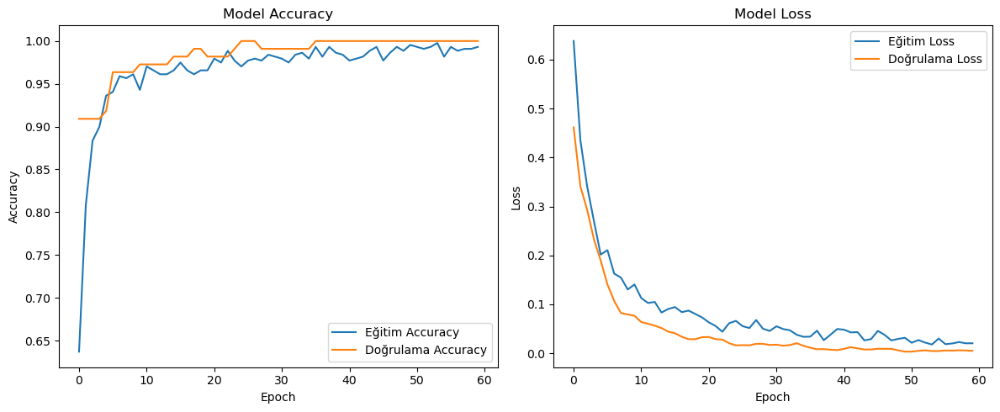

In [46]:
# Eğitim geçmişini görselleştir
plt.figure(figsize=(12, 5))

# 1. Accuracy grafiği
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Eğitim Accuracy')
plt.plot(history.history['val_accuracy'], label='Doğrulama Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# 2. Loss grafiği
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Eğitim Loss')
plt.plot(history.history['val_loss'], label='Doğrulama Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

# 5. Model Analizi ve Değerlendirme

Tüm Modellerin Performans Karşılaştırması:
                 Model  Accuracy
6        Deep Learning  0.990099
0  Logistic Regression  0.980198
2                  SVM  0.970297
4              XGBoost  0.960396
1        Random Forest  0.950495
5             LightGBM  0.940594
3                  KNN  0.930693


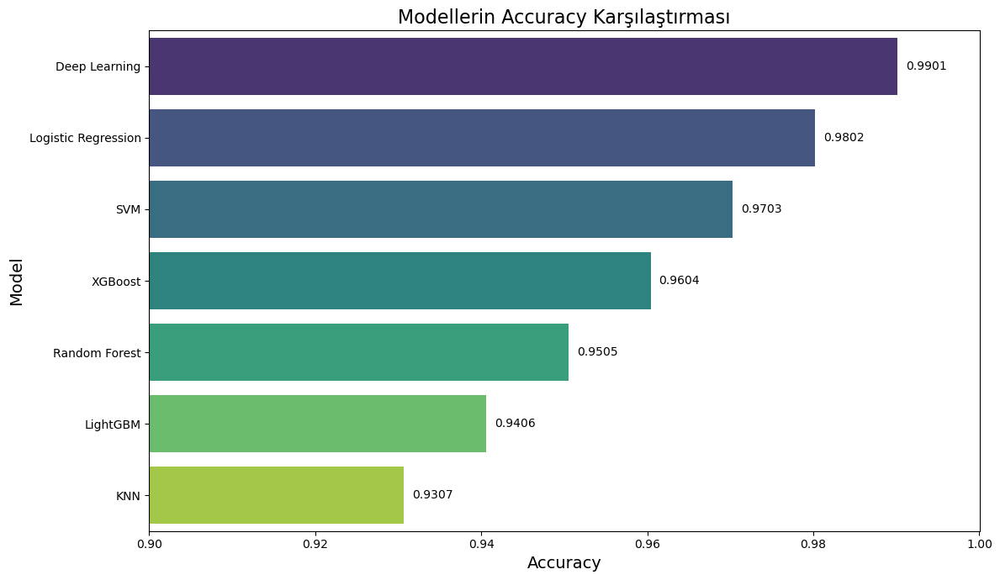

In [47]:
# Model performanslarını bir DataFrame'de topla
model_accuracies = pd.DataFrame({
    'Model': ['Logistic Regression', 'Random Forest', 'SVM', 'KNN', 'XGBoost', 'LightGBM', 'Deep Learning'],
    'Accuracy': [accuracy_lr, accuracy_rf, accuracy_svm, accuracy_knn, accuracy_xgb, accuracy_lgb, accuracy_dl]
})

# Accuracy değerlerine göre sırala
model_accuracies = model_accuracies.sort_values(by='Accuracy', ascending=False)

print("Tüm Modellerin Performans Karşılaştırması:")
print(model_accuracies)

# Model performanslarını görselleştir
plt.figure(figsize=(12, 7))
sns.barplot(x='Accuracy', y='Model', data=model_accuracies, palette='viridis', hue='Model')
plt.xlabel('Accuracy', fontsize=14)
plt.ylabel('Model', fontsize=14)
plt.title('Modellerin Accuracy Karşılaştırması', fontsize=16)
plt.xlim(0.9, 1.0) # Accuracy aralığını daha iyi göstermek için
# Her barın üzerine accuracy değerini yazdır
for index, value in enumerate(model_accuracies['Accuracy']):
    plt.text(value + 0.001, index, f"{value:.4f}", va='center', fontsize=10)
    
plt.tight_layout()
plt.show()

# Modelleri Kaydet
Kendi eğittimiz modelleri streamlit ortamında kullanabilmek için kullanılması gereken model kaydetme fonksiyonları.

In [57]:
# Model Kaydetme - Streamlit Uygulaması için Hazır Modeller
import os
import joblib
import time
import numpy as np
import pandas as pd
from datetime import datetime
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix
import tensorflow as tf

def save_model_for_streamlit(model, model_info, metrics, file_name, 
                            directory="../streamlit_app/models/ready", 
                            preprocessing_info=None, scaler=None):
    """
    Streamlit uygulaması için model kaydetme fonksiyonu
    
    Args:
        model: Eğitilmiş model nesnesi
        model_info: Model türü ve parametreler
        metrics: Model performans metrikleri  
        file_name: Kaydetme dosya adı
        directory: Kaydetme dizini
        preprocessing_info: Ön işleme bilgileri
        scaler: Veri ölçeklendirici
    """
    # Klasörü oluştur
    os.makedirs(directory, exist_ok=True)
    
    # Model türüne göre kaydet
    if model_info["type"] == "neural_network":
        # TensorFlow/Keras modeli için
        model_path = os.path.join(directory, f"{file_name}.h5")
        model.save(model_path)
        print(f"✅ Derin öğrenme modeli kaydedildi: {model_path}")
    else:
        # Scikit-learn modeli için
        model_path = os.path.join(directory, f"{file_name}.joblib")
        joblib.dump(model, model_path)
        print(f"✅ Klasik ML modeli kaydedildi: {model_path}")
    
    # Scaler'ı kaydet (eğer varsa)
    if scaler is not None:
        scaler_path = os.path.join(directory, f"{file_name}_scaler.joblib")
        joblib.dump(scaler, scaler_path)
        print(f"✅ Scaler kaydedildi: {scaler_path}")
    
    # Model bilgileri ve metrikleri kaydet
    info_path = os.path.join(directory, f"{file_name}_info.joblib")
    save_info = {
        "model_info": model_info,
        "metrics": metrics,
        "preprocessing_info": preprocessing_info or {},
        "saved_at": time.strftime("%Y-%m-%d %H:%M:%S"),
        "has_scaler": scaler is not None
    }
    joblib.dump(save_info, info_path)
    print(f"✅ Model bilgileri kaydedildi: {info_path}")
    
    return model_path

def evaluate_and_prepare_metrics(model, X_test, y_test, model_type="classical"):
    """
    Model değerlendirmesi ve metrik hazırlama
    """
    # Tahminleri al
    if model_type == "neural_network":
        y_pred_proba = model.predict(X_test).ravel()
        y_pred = (y_pred_proba > 0.5).astype(int)
    else:
        y_pred = model.predict(X_test)
        if hasattr(model, "predict_proba"):
            y_pred_proba = model.predict_proba(X_test)[:, 1]
        elif hasattr(model, "decision_function"):
            y_pred_proba = model.decision_function(X_test)
        else:
            y_pred_proba = y_pred
    
    # Metrikleri hesapla
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    
    try:
        auc = roc_auc_score(y_test, y_pred_proba)
    except:
        auc = None
    
    cm = confusion_matrix(y_test, y_pred)
    
    metrics = {
        "accuracy": accuracy,
        "precision": precision,
        "recall": recall,
        "f1_score": f1,
        "roc_auc": auc,
        "confusion_matrix": cm.tolist()
    }
    
    print(f"📊 Model Performansı:")
    print(f"   Doğruluk (Accuracy): {accuracy:.4f}")
    print(f"   Kesinlik (Precision): {precision:.4f}")
    print(f"   Hassasiyet (Recall): {recall:.4f}")
    print(f"   F1 Skoru: {f1:.4f}")
    if auc: print(f"   ROC AUC: {auc:.4f}")
    
    return metrics


In [ ]:
# Örnek 1: Geleneksel Makine Öğrenmesi Modeli Kaydetme
"""
Bu hücreyi, eğittiğiniz bir geleneksel makine öğrenmesi modelini 
streamlit uygulamanızda kullanmak üzere kaydetmek için kullanın.

Not: 'model', 'X_test', 'y_test', 'scaler' değişkenlerinin
önceki hücrelerde tanımlanmış olması gerekir.
"""

# ÖRNEk KULLANIM - Geleneksel Model için:
"""
# Model eğitiminden sonra bu kodu çalıştırın:

# 1. Model bilgilerini hazırla
model_info = {
    "type": "random_forest",  # model türü: random_forest, logistic_regression, svm, etc.
    "params": {
        "n_estimators": 100,
        "max_depth": 10,
        "random_state": 42
    },
    "training_time": 5.2  # eğitim süresi (saniye)
}

# 2. Ön işleme bilgilerini hazırla
preprocessing_info = {
    "columns_to_drop": [],  # çıkarılan sütunlar
    "target_column": "target",  # hedef sütun
    "feature_names": feature_names,  # özellik isimleri
    "test_size": 0.2,
    "scaler_type": "StandardScaler"
}

# 3. Model değerlendirmesi yap
metrics = evaluate_and_prepare_metrics(model, X_test, y_test, model_type="classical")

# 4. Modeli kaydet
model_name = f"random_forest_breast_cancer_{datetime.now().strftime('%Y%m%d_%H%M%S')}"
save_model_for_streamlit(
    model=model,
    model_info=model_info,
    metrics=metrics,
    file_name=model_name,
    preprocessing_info=preprocessing_info,
    scaler=scaler  # eğer kullandıysanız
)
"""


In [ ]:
# Örnek 2: Derin Öğrenme (Neural Network) Modeli Kaydetme
"""
Bu hücreyi, eğittiğiniz bir derin öğrenme modelini 
streamlit uygulamanızda kullanmak üzere kaydetmek için kullanın.

Not: 'neural_model', 'X_test', 'y_test', 'scaler', 'history' değişkenlerinin
önceki hücrelerde tanımlanmış olması gerekir.
"""

# ÖRNEK KULLANIM - Derin Öğrenme Model için:
"""
# Neural Network model eğitiminden sonra bu kodu çalıştırın:

# 1. Model bilgilerini hazırla
model_info = {
    "type": "neural_network",
    "params": {
        "layers": [64, 32, 16],  # katman boyutları
        "activation": "relu",
        "dropout_rate": 0.2,
        "optimizer": "adam",
        "epochs": 50,
        "batch_size": 32
    },
    "training_time": 120.5,  # eğitim süresi (saniye)
    "history": history.history  # eğitim geçmişi (eğer kaydetmişseniz)
}

# 2. Ön işleme bilgilerini hazırla
preprocessing_info = {
    "columns_to_drop": [],  # çıkarılan sütunlar
    "target_column": "target",  # hedef sütun
    "feature_names": feature_names,  # özellik isimleri
    "test_size": 0.2,
    "scaler_type": "StandardScaler"
}

# 3. Model değerlendirmesi yap
metrics = evaluate_and_prepare_metrics(neural_model, X_test, y_test, model_type="neural_network")

# 4. Modeli kaydet
model_name = f"neural_network_breast_cancer_{datetime.now().strftime('%Y%m%d_%H%M%S')}"
save_model_for_streamlit(
    model=neural_model,
    model_info=model_info,
    metrics=metrics,
    file_name=model_name,
    preprocessing_info=preprocessing_info,
    scaler=scaler  # eğer kullandıysanız
)
"""

